# <center> <font color=#B40404>Unsupervised Learning Project</center>
    
## <center> <font color=#B40404>Submitted by Utathya Ghosh</center>
    
### <center> <font color=#B40404>Batch - AIML Online Jan 21-A</center>

# <center>PART ONE</center>
# <center>PROJECT BASED</center>
# <center>TOTAL SCORE - 25</center>

• DOMAIN: Automobile

• CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 
continuous attributes 

• DATA DESCRIPTION: The data concerns city-cycle fuel consumption in miles per gallon

• Attribute Information:

1. mpg: continuous
2. cylinders: multi-valued discrete
3. displacement: continuous
4. horsepower: continuous
5. weight: continuous
6. acceleration: continuous
7. model year: multi-valued discrete
8. origin: multi-valued discrete
9. car name: string (unique for each instance

• PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’ 
Steps and tasks: [ Total Score: 25 points]

In [1]:
import numpy as np
import pandas as pd
import json
from scipy.stats import zscore
from sklearn.neighbors import KNeighborsRegressor, NearestNeighbors
from random import sample
from numpy.random import uniform
from math import isnan
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from numpy import arange
from sklearn.linear_model import LinearRegression

#### 1. Import and warehouse data: [ Score: 3 points ]
###### • Import all the given datasets and explore shape and size.

In [2]:
# Load csv file into a dataframe
df_name = pd.read_csv("Part1 - Car name.csv")

# Display Shape and size of df_name dataframe
print("Shape of Car Name csv file :", df_name.shape)
print("Size of Car Name csv file :", df_name.size)
print()

# Open json file
with open('Part1 - Car-Attributes.json', 'r') as fp:
    # Load json file into a dataframe
    df_attr = pd.DataFrame(json.load(fp))

# Display shape and size of df_attr dataframe
print("Shape of Car attribute json file :", df_attr.shape)
print("Size of Car attribute json file :", df_attr.size)

Shape of Car Name csv file : (398, 1)
Size of Car Name csv file : 398

Shape of Car attribute json file : (398, 8)
Size of Car attribute json file : 3184


###### • Merge all datasets onto one and explore final shape and size.

In [3]:
# Open json file
with open('Part1 - Car-Attributes.json', 'r') as fp:
    # Read and Concatenate two files into one dataframe
    df_master = pd.concat([pd.read_csv("Part1 - Car name.csv"), pd.DataFrame(json.load(fp))], axis=1)
    
# Display shape and size of master dataset
print("Shape of Dataset: ", df_master.shape)
print("Size of Dataset: ", df_master.size)

Shape of Dataset:  (398, 9)
Size of Dataset:  3582


###### • Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.

In [4]:
# saving the dataframe as csv
df_master.to_csv('output.csv', index=False)

# saving the dataframe as xls
df_master.to_excel("output.xlsx", index=False)

# saving the dataframe as json
df_master.to_json('output.json')

###### • Import the data from above steps into python.

In [5]:
# Loading the dataframe as csv
df_csv = pd.read_csv('output.csv')

# Loading the dataframe as xls
df_xl = pd.read_excel("output.xlsx")

# Loading the dataframe as json
df_json = pd.read_json('output.json')

In [6]:
# Display the csv dataframe
df_csv

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


In [7]:
# Display the xl dataframe
df_xl

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


In [8]:
# Display the json dataframe
df_json

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


#### 2. Data cleansing: [ Score: 3 points ]
###### • Missing/incorrect value treatment

In [9]:
# Viewing basic information of master dataset
df_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


###### <font color=#B40404>"hp" feature is marked as object although at first glance its values are numeric.

In [10]:
# Going through all the car names
for r in df_master["car_name"]:
    print(r)

chevrolet chevelle malibu
buick skylark 320
plymouth satellite
amc rebel sst
ford torino
ford galaxie 500
chevrolet impala
plymouth fury iii
pontiac catalina
amc ambassador dpl
dodge challenger se
plymouth 'cuda 340
chevrolet monte carlo
buick estate wagon (sw)
toyota corona mark ii
plymouth duster
amc hornet
ford maverick
datsun pl510
volkswagen 1131 deluxe sedan
peugeot 504
audi 100 ls
saab 99e
bmw 2002
amc gremlin
ford f250
chevy c20
dodge d200
hi 1200d
datsun pl510
chevrolet vega 2300
toyota corona
ford pinto
amc gremlin
plymouth satellite custom
chevrolet chevelle malibu
ford torino 500
amc matador
chevrolet impala
pontiac catalina brougham
ford galaxie 500
plymouth fury iii
dodge monaco (sw)
ford country squire (sw)
pontiac safari (sw)
amc hornet sportabout (sw)
chevrolet vega (sw)
pontiac firebird
ford mustang
mercury capri 2000
opel 1900
peugeot 304
fiat 124b
toyota corolla 1200
datsun 1200
volkswagen model 111
plymouth cricket
toyota corona hardtop
dodge colt hardtop
volkswage

In [11]:
# Run through all the other columns
for col in df_master.columns[1:]:
    print(col)
    print(df_master[col].unique())
    print()

mpg
[18.  15.  16.  17.  14.  24.  22.  21.  27.  26.  25.  10.  11.   9.
 28.  19.  12.  13.  23.  30.  31.  35.  20.  29.  32.  33.  17.5 15.5
 14.5 22.5 24.5 18.5 29.5 26.5 16.5 31.5 36.  25.5 33.5 20.5 30.5 21.5
 43.1 36.1 32.8 39.4 19.9 19.4 20.2 19.2 25.1 20.6 20.8 18.6 18.1 17.7
 27.5 27.2 30.9 21.1 23.2 23.8 23.9 20.3 21.6 16.2 19.8 22.3 17.6 18.2
 16.9 31.9 34.1 35.7 27.4 25.4 34.2 34.5 31.8 37.3 28.4 28.8 26.8 41.5
 38.1 32.1 37.2 26.4 24.3 19.1 34.3 29.8 31.3 37.  32.2 46.6 27.9 40.8
 44.3 43.4 36.4 44.6 40.9 33.8 32.7 23.7 23.6 32.4 26.6 25.8 23.5 39.1
 39.  35.1 32.3 37.7 34.7 34.4 29.9 33.7 32.9 31.6 28.1 30.7 24.2 22.4
 34.  38.  44. ]

cyl
[8 4 6 3 5]

disp
[307.  350.  318.  304.  302.  429.  454.  440.  455.  390.  383.  340.
 400.  113.  198.  199.  200.   97.  110.  107.  104.  121.  360.  140.
  98.  232.  225.  250.  351.  258.  122.  116.   79.   88.   71.   72.
  91.   97.5  70.  120.   96.  108.  155.   68.  114.  156.   76.   83.
  90.  231.  262.  134.  119. 

###### <font color=#B40404>Only anomaly seems to be in "hp" and the value is ?. We should turn ? into a numeric value so that the feature can be correctly identified as numeric (int or float)

In [12]:
df_master[df_master["hp"] == "?"]

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


###### <font color=#B40404>Since only one column has 6 values that need to be imputed. We will use KNN to predict these values and we will allow 19 nearest neighbours to vote for each record. The selection choice of 19 is based on a guesstimate of square root of the number of records and 19 is the closest odd and whole number to 392 records which will be used to train.

###### <font color=#B40404>For the sake of simplicity we will not consider "yr" and "origin" in our training since these are discrete values and hence need more understanding and processing. However, our aim now is to impute the 6 values which has "?" and for that we do not need so much details. "car_name" will be dropped as it provides no extra information on learning.

In [13]:
# Create a mask to store the index values of the records with "?"
index_mask = df_master[df_master["hp"] == "?"].index

# Create the train and prediction set for KNN Regressor
X_imp = df_master.drop(["car_name", "hp", "yr", "origin"], axis=1).apply(zscore)
X_imp_train = X_imp.drop(index_mask)
X_imp_pred = X_imp.iloc[index_mask, :]
y_imp_train = df_master[df_master["hp"] != "?"]["hp"]

In [14]:
# Building the model
classifier = KNeighborsRegressor(n_neighbors=19, metric="minkowski", p=2)
classifier.fit(X_imp_train, y_imp_train)

# Predict values to impute
y_pred = classifier.predict(X_imp_pred)

In [15]:
# Create a new dataframe called auto so as to keep master intact
df_auto = df_master.copy()

# Assign rounded prediction values to the respective missing value
df_auto.loc[index_mask, "hp"] = np.around(list(y_pred), decimals=0)

# Convert feature "hp" to int type
df_auto["hp"] = df_auto["hp"].astype("int64")

In [16]:
# Display the final dataset information
df_auto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    int64  
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(5), object(1)
memory usage: 28.1+ KB


###### • Drop attribute/s if required using relevant functional knowledge

###### <font color=#B40404>We can drop the car_name column because it will be useless when it comes to Machine Linguistics. However, once we formalised our cluster, this could be a very meaningful identifier on which cars are in the same cluster.

In [17]:
# Drop the car_name column
df_auto.drop("car_name", axis=1, inplace=True)

# Drop the car_name column
df_auto_lr = df_auto.copy()

###### • Perform another kind of corrections/treatment on the data.

###### <font color=#B40404>Imputing missing values with mean of the feature set

In [18]:
# Creating a copy as mean_auto dataset so as to keep master intact
df_mean_auto = df_master.copy()
df_mean_auto[df_mean_auto["hp"] == "?"] = np.around(df_mean_auto["hp"][df_mean_auto["hp"] != "?"].mean())

# Convert feature "hp" to int type
df_mean_auto["hp"] = df_mean_auto["hp"].astype("int64")

#### 3. Data analysis & visualisation: [ Score: 4 points ]
###### • Perform detailed statistical analysis on the data.

###### <font color=#B40404>We will proceed with df_auto dataset with imputation done through the help of KNN, till we have a reason otherwise

###### <font color=#B40404>Based on Attribute information from meta-data we are to understand that cylinders (cyl), model-year (yr) and origin are multi-valued and discrete, car_name has been dropped already and the rest are all continuous.  So let us explore our discrete features first.

In [19]:
for col in ['cyl', 'yr', 'origin']:
    print("Column name: ", col)
    print("Discrete Values: ", df_auto[col].unique())
    print("No. of values :", len(df_auto[col].unique()))
    print("With equal distribution No. of records on average with unique value: ", df_auto.shape[0]/len(df_auto[col].unique()))
    print("Proportion of sample with similar attribute: %2.0f%%" %(100/len(df_auto[col].unique())))
    print()

Column name:  cyl
Discrete Values:  [8 4 6 3 5]
No. of values : 5
With equal distribution No. of records on average with unique value:  79.6
Proportion of sample with similar attribute: 20%

Column name:  yr
Discrete Values:  [70 71 72 73 74 75 76 77 78 79 80 81 82]
No. of values : 13
With equal distribution No. of records on average with unique value:  30.615384615384617
Proportion of sample with similar attribute:  8%

Column name:  origin
Discrete Values:  [1 3 2]
No. of values : 3
With equal distribution No. of records on average with unique value:  132.66666666666666
Proportion of sample with similar attribute: 33%



###### <font color=#B40404>Based on the above information, Model-year is quite dispersed in the sample. If we consider the sample a good representation of the population then the cluster created by feature year will at average contain 8% of the population.
    
###### <font color=#B40404>With similar logic, Origin at average can uniquely identify 33% and Cylinders can uniquely identify 20% of the population.
    
###### <font color=#B40404>Assumption 1: We will assume that Cylinder is an ordinal quantity, ie. 4 cylinders is closer to 3 cylinders than 8 cylinders and that 3 cylinders is in some aspect less than 4 cylinders. Thus it will be logical to consider it discrete but its numeric version have real world meaning.
    
###### <font color=#B40404>Assumption 2: We will assume that Model-year is categorical. Although, year is definitely ordered, we can anticipate that in the world of automobiles, the year of production does not play ordinal role but more of a categorical role. In short feature model-year will have more meaning if its numeric counterpart is not considered to have any order.
    
###### <font color=#B40404>Assumption 3: Similar to Assumption 2, the numeric counterpart of the origin feature will be considered categorical.

###### <font color=#B40404>Assumption 4: For Kmeans, which thrives on numeric input. We will convert our categorical features to its relative frequencies. We believe that the information provided in its categorical form will not be useful. On the other hand what proportion of the population is described by each feature attribute will have more meaning (it might contain real world information like demand and supply) when we attempt to cluster.
    
###### <font color=#B40404>Based on our Assumption 2 and 3 along with our Assumption 4 we will combine the two features (yr and origin) and then replace its value by the relative frequency.

In [20]:
# Combining feature year and origin
df_auto["cat"] = df_auto["yr"]*10 + df_auto["origin"]

# Get the unique values and its frequency counts
key, val = np.unique(df_auto["cat"], return_counts=True)

# Replace attributes of feature cat with the relative frequency of each attribute
df_auto["cat"].replace(dict(zip(key, val/df_auto.shape[0])), inplace=True)

# Dropping features yr and origin
df_auto.drop(["yr", "origin"], axis=1, inplace=True)

# Display the statistics of remaining features
df_auto.describe()

,mpg,cyl,disp,hp,wt,acc,cat
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.103015,2970.424623,15.568090,0.038888
std,7.815984,1.701004,104.269838,38.339159,846.841774,2.757689,0.019323
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,0.005025
25%,17.500000,4.000000,104.250000,75.000000,2223.750000,13.825000,0.020101
50%,23.000000,4.000000,148.500000,92.500000,2803.500000,15.500000,0.045226
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,0.055276
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,0.072864


In [21]:
print("To understand our new feature called cat (short for categorical) :-")
print("With equal distribution No. of records on average with unique value: ", df_auto.shape[0]/len(key))
print("Proportion of sample with similar attribute: %2.5f%%" %(100/len(key)))

To understand our new feature called cat (short for categorical) :-
With equal distribution No. of records on average with unique value:  10.205128205128204
Proportion of sample with similar attribute: 2.56410%


###### <font color=#B40404>Now let's check Hopkins Statistics for the auto dataset to confirm if the set is clusterable.
    
###### <font color=#B40404>Hopkins Statistics is a value between 0 and 1 and the closer it is to one the more clusterable the set is. 
    For our test we will consider :-
    Any value above 0.7 as high tendency to cluster
    Any value above 0.5 and less than 0.7 as low tendency to cluster
    Any value below or equal to 0.5 will require us to reject the dataset at its present form

In [22]:
# Define a function for hopkins test
def hopkins(X):
    d = X.shape[1]
    #d - len(vars)
    n = len(X) #rows
    m = int(0.1*n)
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
    
    rand_X = sample(range(0, n, 1), m)
    
    ujd = []
    wjd = []

    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print("Null Present")
        print(ujd, wjd)
        H = 0
    return(H)

In [23]:
# Scale auto dataset
scale = StandardScaler()

# Run hopkins test on scaled data
print("Hopkins test statistics is : ", hopkins(pd.DataFrame(scale.fit_transform(df_auto))))

Hopkins test statistics is :  0.860931072649194


###### • Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis. 
###### Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

###### <font color=#B40404>For Multivariate Analysis we will check correlation through a correlation matrix

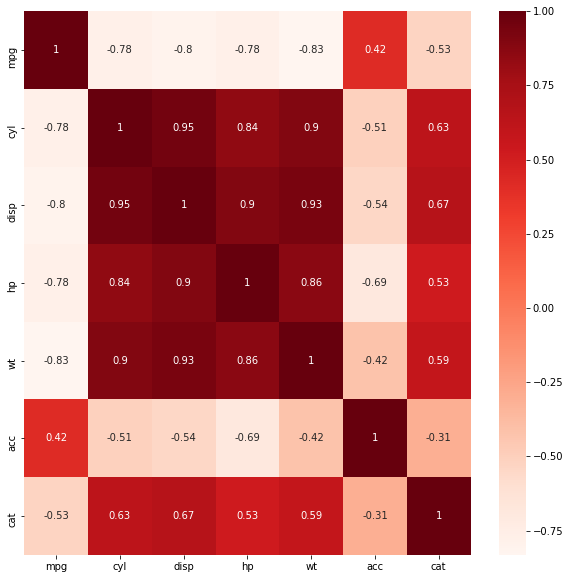

In [24]:
# Displaying the correlation map
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_auto.corr(), annot=True, cmap='Reds', ax=ax)
plt.show()

###### <font color=#B40404>Let's do a bivariate analysis through a pairplot

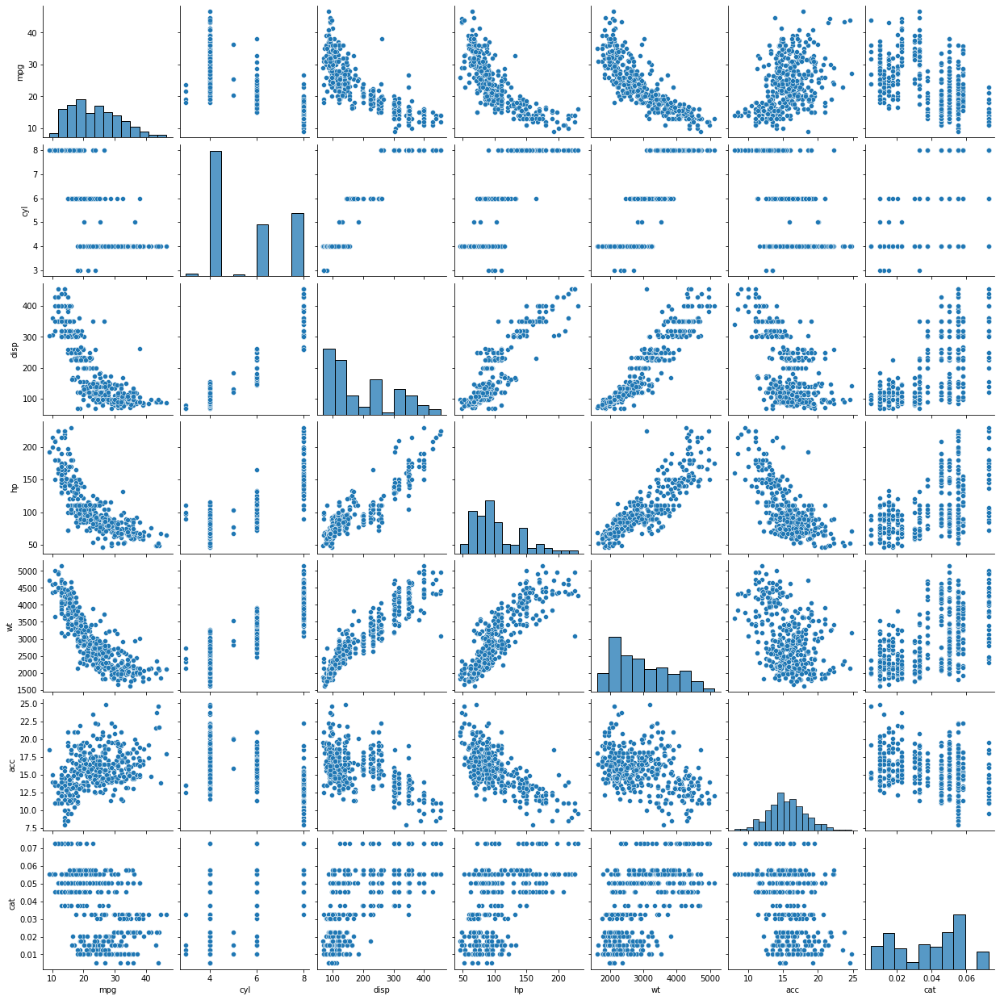

In [25]:
sns.pairplot(df_auto)

###### <font color=#B40404>From the charts above we can see that most of the variables have a high correlation with each other. This follows our understanding of the domain as well. This is because we know that Force = Mass x Acceleration. Which would mean that weight(Mass x gravitational acceleration) and acceleration are inversely proportional. Also since Power = Work / Time taken and Work = Force x Displacement. This would mean that horsepower or hp (Power) is directly proportional to Force (which is directly proportional to weight and acceleration, as seen earlier). Various associations like these is also suggested by the pairplot above.
    
###### <font color=#B40404>Hence, we will create new feature using PCA and then keep 95% of the information using mpg, hp, cyl, disp and wt. We are choosing these features since they all show a very high correlation. We keep acceleration and cat out of this since the correlations for those features are around absolute value of (0.5)

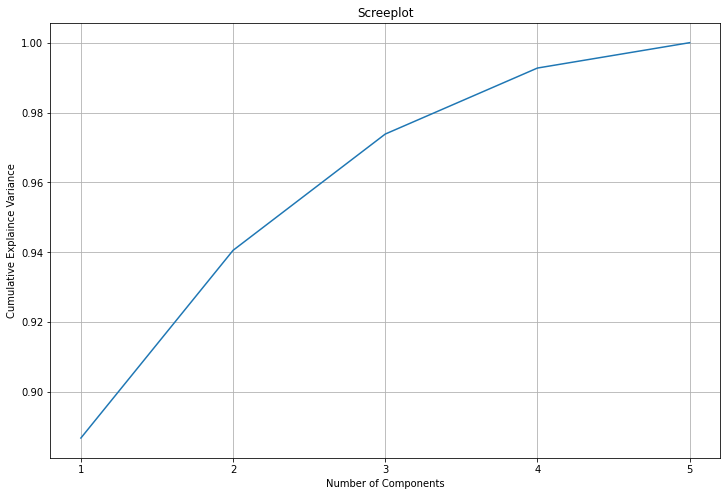

In [26]:
# Initialise PCA
pca = PCA(svd_solver='randomized', random_state=42)

# Fit PCA to the required features after scaling
pca.fit(pd.DataFrame(scale.fit_transform(df_auto.iloc[:, :5])))

# Display the screeplot to determine how many componenets to keep
fig = plt.figure(figsize = (12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.xticks(range(len(pca.explained_variance_ratio_)), range(1, len(pca.explained_variance_ratio_)+1))
plt.ylabel("Cumulative Explaince Variance")
plt.title("Screeplot")
plt.grid()
plt.show()

In [27]:
# Display amount of variance explained
print("First 3 components explain %2.5f%% of the variance of the selected features" 
      %(sum(pca.explained_variance_ratio_[:3])*100))

First 3 components explain 97.38471% of the variance of the selected features


###### <font color=#B40404>Based on the evidence of the screeplot above we will take the first 3 components since it will account for around 98% of the variance information.

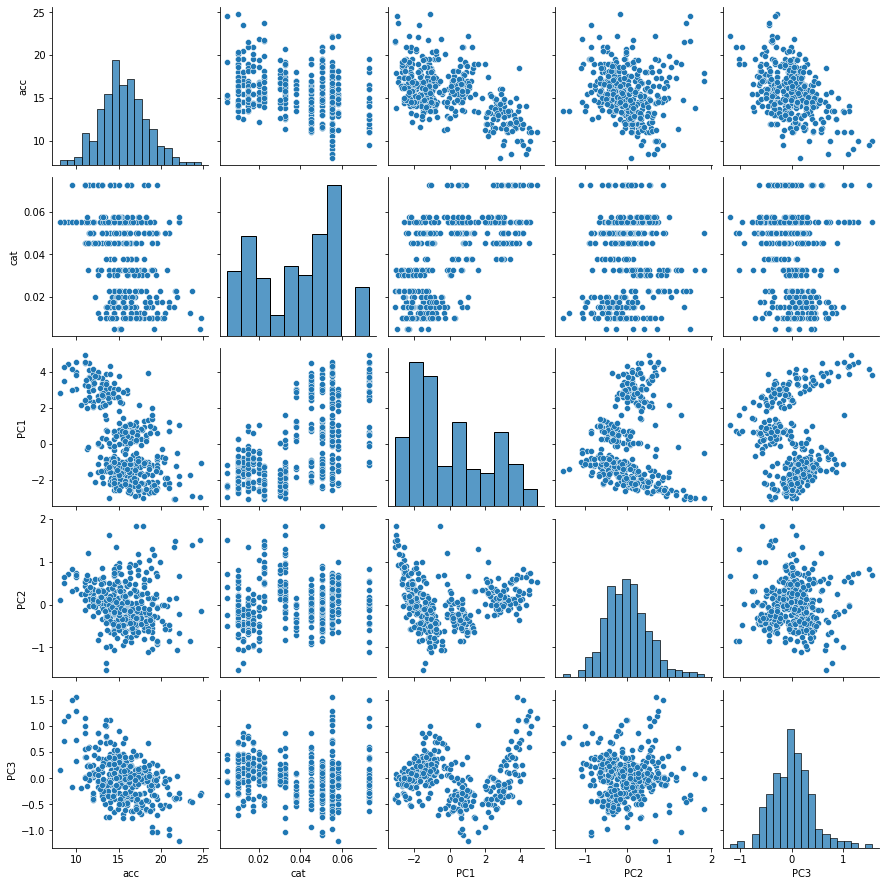

In [28]:
# Reinitialising PCA with the required number of components
pca = PCA(n_components=3, svd_solver='randomized', random_state=42)

# Assigning new features to the auto dataset and dropping compressed features
df_auto.loc[:, ["PC1", "PC2", "PC3"]] = pca.fit_transform(pd.DataFrame(scale.fit_transform(df_auto.iloc[:, :5])))
df_auto.drop(df_auto.columns[:5], axis=1, inplace = True)

# Displaying the new pairplot
sns.pairplot(df_auto)

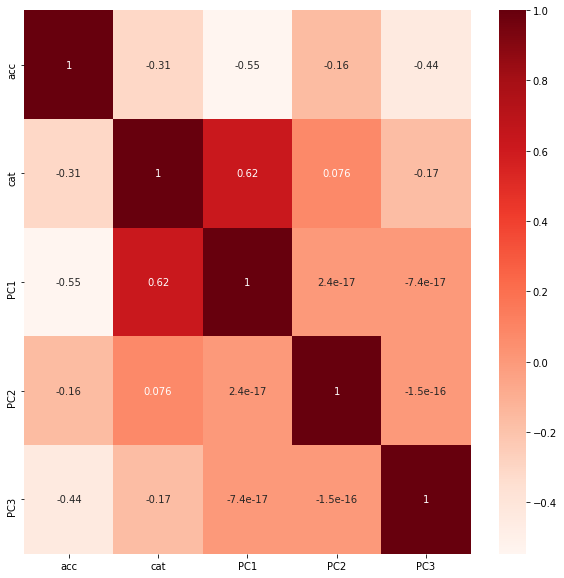

In [29]:
# Displaying the correlation map
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_auto.corr(), annot=True, cmap='Reds', ax=ax)
plt.show()

###### <font color=#B40404>Let's look at an Univariate analysis through Boxplot. The boxplot will allow us to locate if there are outliers.

<AxesSubplot:>

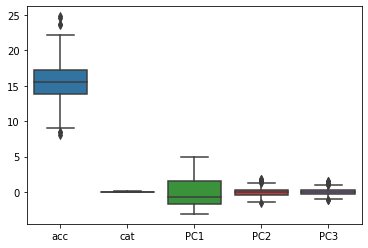

In [30]:
# Displaying the boxplot
sns.boxplot(data=df_auto)

###### <font color=#B40404>At a quick glance we can be sure that there are outliers in acc, PC2 and PC3. Outliers do affect K means and hence let us create a mask which can be used to remove outliers.
    
###### <font color=#B40404>For Kmeans we will be applying zscore to all columns later anyhow. Hence, we will locate outliers using zscores for convenience.

In [31]:
# Apply Zscore to all columns in dataset auto
df_auto = df_auto.apply(zscore)

# Create a list with index values of all rows with atleast one outlier (Value > 3 standard deviations)
outlier_mask = df_auto[(~(df_auto<3).all(axis=1))].index

###### <font color=#B40404>Before we proceed let's have a quick look at the data distribution. To keep things simple we will try to visualise the distribution on 3 dimensions. So we will need to compress the dataset to 3 components.

Text(0.5, 0.92, '3D plot of KMeans Clustering')

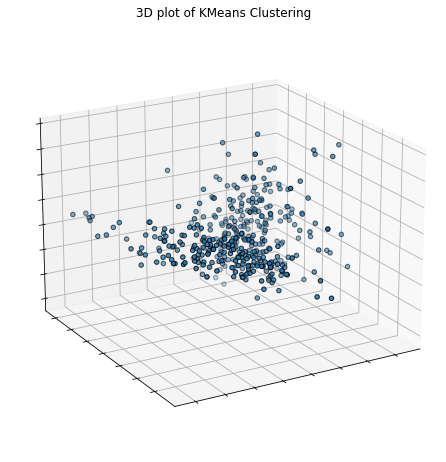

In [32]:
# Reinitialising PCA with 3 components
pca = PCA(n_components=3, svd_solver='randomized', random_state=42)

# Assigning new features to the auto dataset and dropping compressed features
df_auto_vis = pd.DataFrame(pca.fit_transform(df_auto), columns=["Vis1", "Vis2", "Vis3"])

# 3D plots of clusters
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=20, azim=60, auto_add_to_figure=False)
fig.add_axes(ax)
ax.scatter(df_auto_vis.iloc[:, 0], df_auto_vis.iloc[:, 1], df_auto_vis.iloc[:, 2], edgecolor='k')
ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_title('3D plot of KMeans Clustering')

###### <font color=#B40404>Note: That distribution in 3D will look different from distribution in 5 feature space. So, the figure above is for visualisation purposes only and should not be confused with actual distribution

#### 4. Machine learning: [ Score: 8 points ]
###### • Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.

###### <font color=#B40404>First let us look at Kmeans and mean distortions across different number of clusters

C:\Users\utath\anaconda3\envs\Udemypython\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

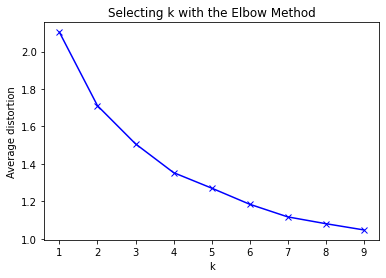

In [33]:
#Finding optimal no. of clusters
clusters=range(1,10)
meanDistortions=[]

# Run a loop for different number of clusters
for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(df_auto)
    prediction=model.predict(df_auto)
    meanDistortions.append(sum(np.min(cdist(df_auto, model.cluster_centers_, 'euclidean'), axis=1)) / df_auto.shape[0])

# Plot the mean distortion against the number of clusters
plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

###### <font color=#B40404>The mean distortions do not have a clear elbow point but compression between 4 and 6 seem reasonable.

###### <font color=#B40404>Now let's look at the silhouette scores for kmeans clusters.

For n_clusters = 3 The average silhouette_score is : 0.2909176179922629
For n_clusters = 4 The average silhouette_score is : 0.3000507346184173
For n_clusters = 5 The average silhouette_score is : 0.2859484009933728
For n_clusters = 6 The average silhouette_score is : 0.2975672577055842
For n_clusters = 7 The average silhouette_score is : 0.29604348195354596


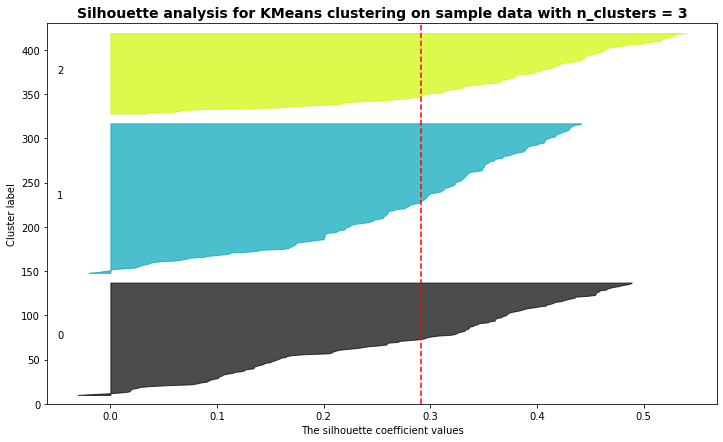

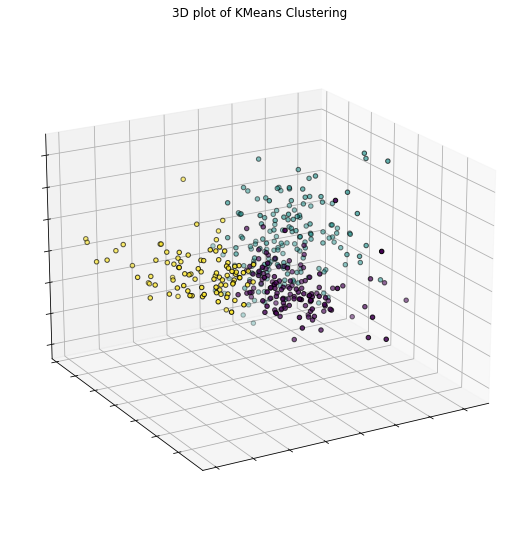

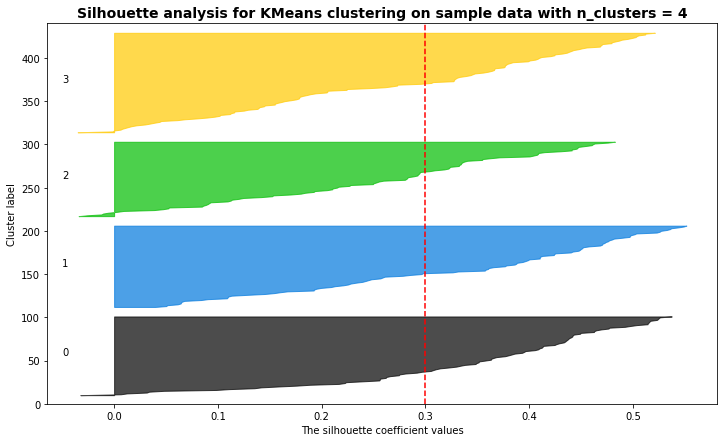

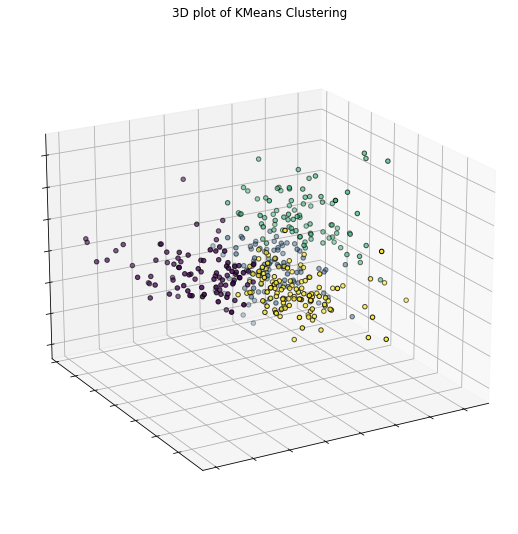

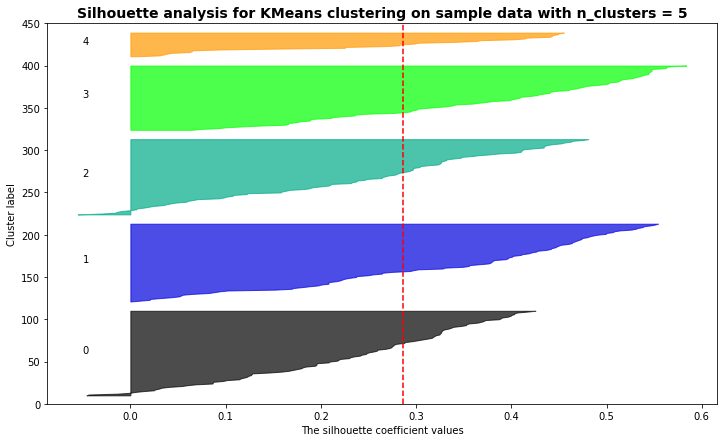

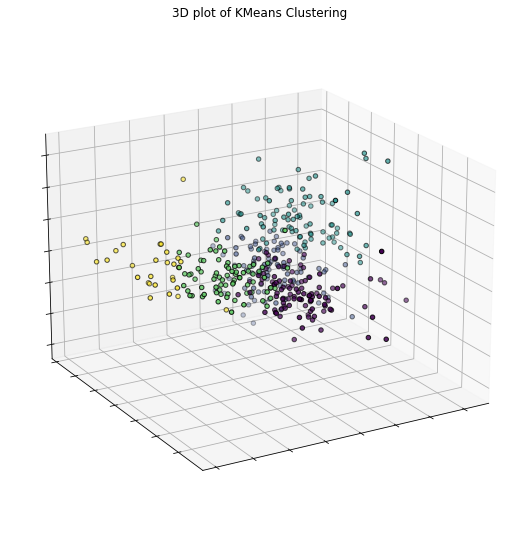

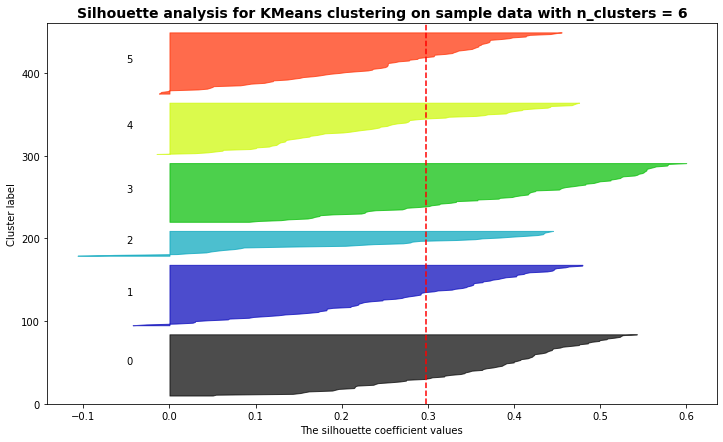

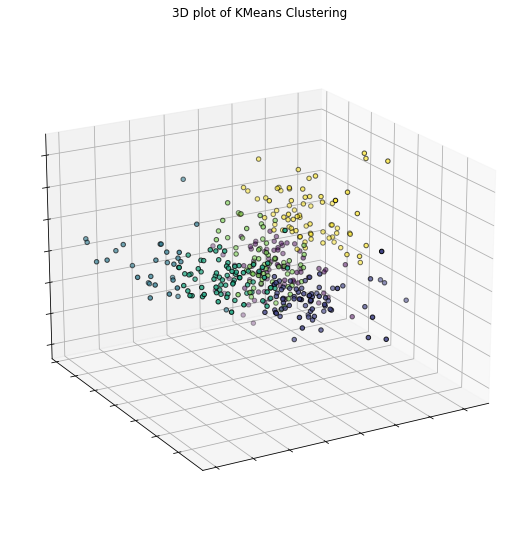

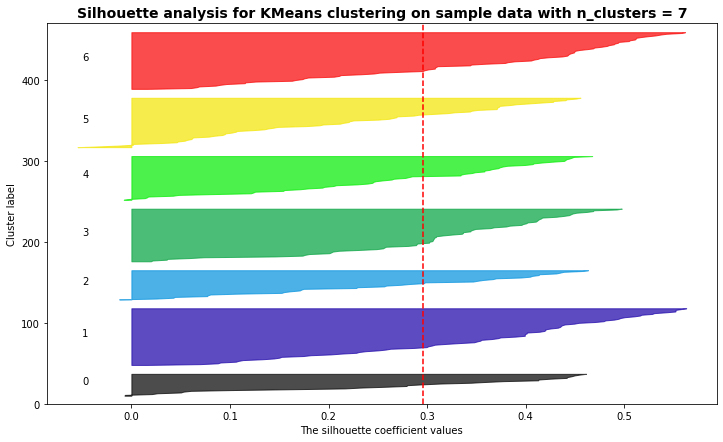

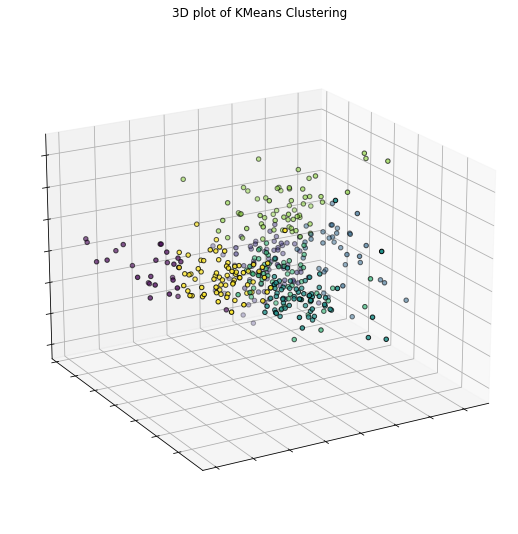

In [34]:
# Set the a list of number of clusters to check
range_n_clusters = [3, 4, 5, 6, 7]

# Run a loop for each number of cluster
for n_clusters in range_n_clusters:
    # Create a subplot for sihoutte diagram
    fig, ax1 = plt.subplots()
    fig.set_size_inches(12, 7)

    # The 1st subplot is the silhouette plot
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_auto.drop(outlier_mask)) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 42 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(df_auto.drop(outlier_mask))

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_auto.drop(outlier_mask), cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_auto.drop(outlier_mask), cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # 2nd Plot showing the actual clusters formed
    
    # 3D plots of clusters
    fig2 = plt.figure(figsize=(8, 7))
    ax2 = Axes3D(fig2, rect=[0, 0, .95, 1], elev=20, azim=60, auto_add_to_figure=False)
    fig2.add_axes(ax2)
    labels = clusterer.labels_
    ax2.scatter(df_auto_vis.drop(outlier_mask).iloc[:, 0], df_auto_vis.drop(outlier_mask).iloc[:, 1], 
               df_auto_vis.drop(outlier_mask).iloc[:, 2],c=labels.astype(float), edgecolor='k')
    ax2.w_xaxis.set_ticklabels([])
    ax2.w_yaxis.set_ticklabels([])
    ax2.w_zaxis.set_ticklabels([])
    ax2.set_title('3D plot of KMeans Clustering')

    # Labeling the clusters
    centers = clusterer.cluster_centers_

    ax1.set_title(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

###### <font color=#B40404>Now let's look at Hierarchical Clustering and the number of clusters through dendogram

In [35]:
#### generate the linkage matrix
Z = linkage(df_auto, 'ward', metric='euclidean')
Z.shape

(397, 4)

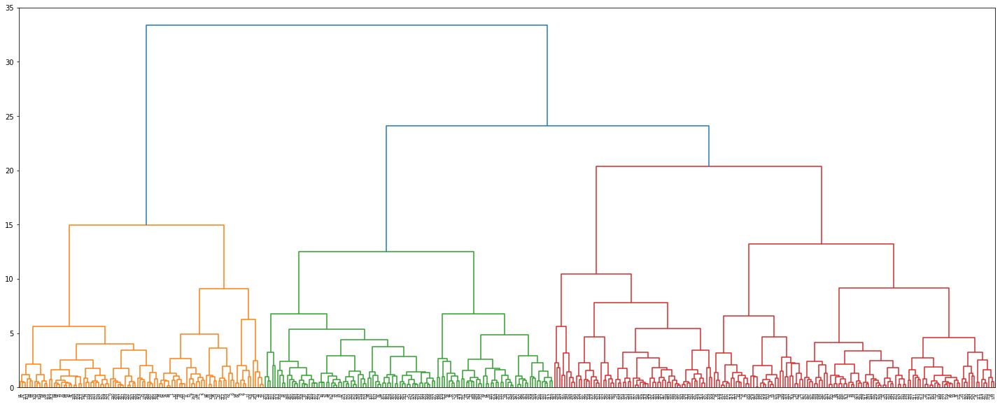

In [36]:
# Display the Dendogram
plt.figure(figsize=(25, 10))
dendrogram(Z)
plt.show()

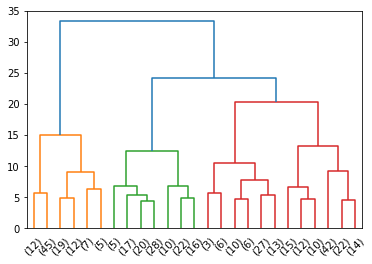

In [37]:
# Display only the last 10 merged clusters
dendrogram(
    Z,
    truncate_mode='lastp',  
    p=25,
)
plt.show()

In [38]:
disp = 0
tmp = 0
n = 100
for dist in arange(5.0, 35.0, 0.25):
    clusters = fcluster(Z, dist, criterion='distance')
    if len(np.unique(clusters)) < n:
        if (dist-tmp) > disp:
            disp = dist - tmp
            tmp = dist
            max_dist = dist
            n = len(np.unique(clusters))
            print("No. of cluster %d, distance %2.2f & gap %2.2f " %(n, max_dist, disp))

No. of cluster 19, distance 5.00 & gap 5.00 
No. of cluster 8, distance 10.25 & gap 5.25 
No. of cluster 4, distance 15.75 & gap 5.50 
No. of cluster 3, distance 21.50 & gap 5.75 
No. of cluster 2, distance 27.50 & gap 6.00 
No. of cluster 1, distance 33.75 & gap 6.25 


###### • Share your insights about the difference in using these two methods. 

###### <font color=#B40404>Although the largest gap is at 6.25, it is pointless to have only 1 cluster at the end. However the dendograms suggest that 3 clusters are ideal for Hierarchical clustering. On the other hand, for Kmeans we found that the best silhouette score is at 4 clusters.

###### <font color=#B40404>Kmeans: Kmeans algorithm is slightly more complex to implement and also to visualise on 2D (or 3D). However, silhouette scores help us explain the number of clusters we chose (if it cannot be derived from functional knowledge) much more convincingly. For example, based on the research done on the data, I am much more confident saying that 4 clusters is the ideal number of clusters for this dataset because Kmeans (silhouette score) test helps us ascertain that.
    
###### <font color=#B40404>Hierarchical Clusering: This type of clustering is much more easier to implement (Fewer codelines) and also thanks to Dendograms it is easier to visualise as well. It is the measure of simple distance on a higher dimension feature space (hard to visualise). However, gap test or simply measuring the distance on dendograms is not a very convincing way of settling on a cluster number. For example, based on the research done on data, the largest gap was at the last linkage, suggesting very low compression. It also takes more computational power than Kmeans.
    
###### <font color=#B40404>To the above comments I would like to add that from the very beginning we were getting hints that the dataset was not optimally clusterable. Silhouette diagram, silhouette scores and mean distortion graph all showed that when choosing optimal cluster size there wasn't a clear winner.

#### 5. Answer below questions based on outcomes of using ML based methods. [ Score: 5 points ]
###### • Mention how many optimal clusters are present in the data and what could be the possible reason behind it.

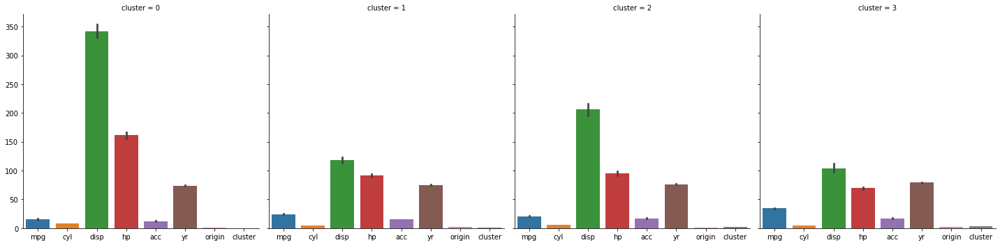

In [39]:
# Use Kmeans to cluster
model=KMeans(n_clusters=4)
model.fit(df_auto.drop(outlier_mask))

# Predict cluster into a new column
df_auto_lr["cluster"] = model.predict(df_auto)

# Create a barplot sided by side to visualise the properties of different features of each cluster
g = sns.catplot(data=df_auto_lr.drop("wt",axis=1),
            col="cluster",
            kind="bar")

###### <font color=#B40404>Based on the work done earlier and because Kmeans provided more conclusive evidence of optimal number of clusters. We will accept Kmeans silhouette score winner, 4 clusters as the optimal number of clusters.
    
###### <font color=#B40404>A possible reason behind it could be that different clusters have different features that took priority. Like in Clusters 2 and 3 horsepower and displacement are starkly different from each other and also the rest of the dataset.

###### • Use linear regression model on different clusters separately and print the coefficients of the models individually

###### <font color=#B40404>Let's look at the Kmeans clusters and it's Linear Regression coeffiecients

In [40]:
# Use Kmeans to cluster
model=KMeans(n_clusters=4)
model.fit(df_auto.drop(outlier_mask))

# Predict cluster into a new column
df_auto_lr["cluster"] = model.predict(df_auto)

In [41]:
# Initiate Regression Model
regression_model = LinearRegression()

# Loop through all clusters
for clus in range(len(np.unique(df_auto_lr["cluster"]))):
    # Drop outliers
    data = df_auto_lr.drop(outlier_mask)
    
    # Filter the required cluster
    data = data[data["cluster"] == clus]
    
    # Create dummy variables and drop one dummy variable
    data = pd.get_dummies(data, columns=['origin']).iloc[:, :-1]
    data = pd.get_dummies(data, columns=['yr']).iloc[:, :-1]
    
    # Seperate Independent and dependent variable
    y = data.pop("mpg")
    X = data.drop("cluster", axis=1)
    regression_model.fit(X, y)
    
    # Display Coeeficients by cluster number
    print("Cluster ", clus)
    intercept = regression_model.intercept_
    print("The intercept for our model is {}".format(intercept))
    for idx, col_name in enumerate(X.columns):
        print("The coefficient for {} is {}".format(col_name, regression_model.coef_[idx]))
    print()

Cluster  0
The intercept for our model is 39.20768792460946
The coefficient for cyl is 0.9450775836509743
The coefficient for disp is -0.007783625385544016
The coefficient for hp is 0.016035676366644897
The coefficient for wt is -0.007314829367812868
The coefficient for acc is 0.44893395995900376
The coefficient for origin_1 is 0.8163544577265083
The coefficient for origin_2 is 1.7065497963403742
The coefficient for yr_70 is -14.4576117952446
The coefficient for yr_71 is -7.213219368870247
The coefficient for yr_73 is -11.048435460796302
The coefficient for yr_74 is -6.7339446464080766
The coefficient for yr_75 is -4.855804780619515
The coefficient for yr_76 is -4.667582854543182
The coefficient for yr_77 is -4.671892452502854
The coefficient for yr_78 is -1.8166558274209563
The coefficient for yr_79 is -1.9942576303805222
The coefficient for yr_80 is 0.5655979035769553
The coefficient for yr_81 is -1.1289037600759182

Cluster  1
The intercept for our model is 58.69185666778816
The coe

###### <font color=#B40404>Let's look at the Hierarchical clusters and it's Linear Regression coeffiecients

In [42]:
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')

# Predict cluster into a new column
df_auto_lr["cluster"] = hc.fit_predict(df_auto)

In [43]:
# Initiate Regression Model
regression_model = LinearRegression()

# Loop through all clusters
for clus in range(len(np.unique(df_auto_lr["cluster"]))):
    # Drop outliers
    data = df_auto_lr.drop(outlier_mask)
    
    # Filter the required cluster
    data = data[data["cluster"] == clus]
    
    # Create dummy variables and drop one dummy variable
    data = pd.get_dummies(data, columns=['origin']).iloc[:, :-1]
    data = pd.get_dummies(data, columns=['yr']).iloc[:, :-1]
    
    # Seperate Independent and dependent variable
    y = data.pop("mpg")
    X = data.drop("cluster", axis=1)
    regression_model.fit(X, y)
    
    # Display Coeeficients by cluster number
    print("Cluster ", clus)
    intercept = regression_model.intercept_
    print("The intercept for our model is {}".format(intercept))
    for idx, col_name in enumerate(X.columns):
        print("The coefficient for {} is {}".format(col_name, regression_model.coef_[idx]))
    print()

Cluster  0
The intercept for our model is 49.5069465843585
The coefficient for cyl is 0.7013317817678006
The coefficient for disp is 0.0063259091829923645
The coefficient for hp is -0.05742803096804463
The coefficient for wt is -0.007825841380684165
The coefficient for acc is 0.22543343478119404
The coefficient for origin_1 is -1.1245782699899796
The coefficient for origin_2 is 0.5486832620636003
The coefficient for yr_70 is -8.723724210325994
The coefficient for yr_71 is -7.879379228235578
The coefficient for yr_72 is -9.876587311974243
The coefficient for yr_73 is -10.985469518482265
The coefficient for yr_74 is -7.946870471911074
The coefficient for yr_75 is -6.908816845265908
The coefficient for yr_76 is -7.559428099326569
The coefficient for yr_77 is -6.509650160595093
The coefficient for yr_78 is -5.227056349844411
The coefficient for yr_79 is -1.0398082679181442
The coefficient for yr_80 is -0.2311651294462274
The coefficient for yr_81 is -1.6756910829787226

Cluster  1
The inte

###### • How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

###### <font color=#B40404>Using different Regression models for different clusters enables us to understand how miles per gallon gets affected based on different features in each cluster. So, if we had used one single model then we would get one set of coefficients and intercept, this method would be biased by the assumption that all cars behave similarly. Whereas by compressing the dataset into clusters, we can identify a particular class of cars, and then on the particular class we can predict how miles per gallon is affected by different features.

#### 6. Improvisation: [ Score: 2 points ]
###### • Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future 

###### <font color=#B40404>More information on the origin feature would be good. More information on whether weight is the weight of the engine or the car as a whole would become important as miles per gallon (mpg) would surely have a relation with the drag. Maybe even other mpg related information like the type of fuel the car uses, such as petrol or diesel, or where was mpg measured on city or on highway could be important. However, very few data points were missing or erroneous, so that is good but more data is always useful.

# <center>PART TWO</center>
# <center>PROJECT BASED</center>
# <center>TOTAL SCORE - 5</center>

• DOMAIN: Manufacturing 
• CONTEXT: Company X curates and packages wine across various vineyards spread throughout the country.
• DATA DESCRIPTION: The data concerns the chemical composition of the wine and its respective quality.
Attribute Information: 
1. A, B, C, D: specific chemical composition measure of the wine
2. Quality: quality of wine [ Low and High ]

• PROJECT OBJECTIVE: Goal is to build a synthetic data generation model using the existing data provided by the company.

In [44]:
import pandas as pd

#### Steps and tasks: [ Total Score: 5 points]
###### 1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data

In [45]:
# Load csv file into a dataframe
df_name = pd.read_excel("Part2 - Company.xlsx")

In [46]:
# Building a class for imputing
class Myimputer(object):
    def __init__(self, null_columns=[]):
        self.null_columns = null_columns
    
    def _check_data_type(self, ser):
        # This function returns the datatype of column
        return(ser.dtype.name)
        
    def fit(self, df):
        # This function checks which columns have null value
        # Null_columns value can be assigned by the user, this checks if null_columns was provided by user
        if not self.null_columns:
            for col in df.columns:
                if df[col].isnull().any():
                    # Create the null columns list
                    self.null_columns.append(col)
        else:
            # Check if null-columns values provided by user is actually null
            for col in self.null_columns:
                if df[col].notnull().all():
                    print("Error: Incorrect null_columns property added")
        return(self.null_columns)
    
    def replace(self, df):
        # This functions replace categorical columns null values with most frequent value and numerical column with median value
        # Check if null columns values exist in dataframe
        if all(item in df.columns for item in self.null_columns):
            for col in self.null_columns:
                data = self._check_data_type(df[col])
                if data == "categorical" or data == "object":
                    # Convert null to mode values
                    idx = df[df[col].isnull()].index
                    df.loc[idx, col] = df[col][df[col].notnull()].mode()[0]
                elif data in ["int32", "int64", "float32", "float64"]:
                    # Convert null to median values
                    idx = df[df[col].isnull()].index
                    df.loc[idx, col] = df[col][df[col].notnull()].median()
                else:
                    print("Could not recognise datatype %s. Please change to int, float, object or categorical" %(data))
        else:
            print("Name mismatch between fit and replace")
        return(df)
    
    def fit_replace(self, df):
        # This function checks values and imputes value together
        # Null_columns value can be assigned by the user, this checks if null_columns was provided by user
        if not self.null_columns:
            for col in df.columns:
                if df[col].isnull().any():
                    data = self._check_data_type(df[col])
                    if data == "categorical" or data == "object":
                        # Convert null to mode values
                        idx = df[df[col].isnull()].index
                        df.loc[idx, col] = df[col][df[col].notnull()].mode()[0]
                    elif data in ["int32", "int64", "float32", "float64"]:
                        # Convert null to median values
                        idx = df[df[col].isnull()].index
                        df.loc[idx, col] = df[col][df[col].notnull()].median()
                    else:
                        print("Could not recognise datatype %s. Please change to int, float, object or categorical" %(data))
        else:
            # Check if null-columns values provided by user is actually null
            for col in self.null_columns:
                if df[col].notnull().all():
                    print("Error: Incorrect null_columns property added")
                else:
                    df = self.replace(df)
        return(df)

In [47]:
# Initialise object
imp = Myimputer()

# Impute Null values
imp.fit_replace(df_name)

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,Quality A
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
...,...,...,...,...,...
56,200,186,185,179,Quality B
57,137,182,165,199,Quality A
58,88,39,9,102,Quality A
59,180,157,192,198,Quality A


In [48]:
# Display basic information
df_name.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  61 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


# <center>PART THREE</center>
# <center>PROJECT BASED</center>
# <center>TOTAL SCORE - 20</center>

• DOMAIN: Automobile

• CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

• DATA DESCRIPTION: The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

• All the features are numeric i.e. geometric features extracted from the silhouette.

• PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the 
model using just the raw data.

In [49]:
import pandas as pd
import numpy as np
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import ttest_ind, shapiro
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#### Steps and tasks: [ Total Score: 20 points]
###### 1. Data: Import, clean and pre-process the data

In [50]:
# Load csv file into a dataframe
df_vehicle = pd.read_csv("Part3 - vehicle.csv")

df_vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

###### <font color=#B40404>If we remove all the Null records then we still have around 813 records left with which we can work with. So we will simply drop the Null records instead of imputing them.

In [51]:
# Dropping records with a ny Null value
df_clean = df_vehicle.drop(df_vehicle[df_vehicle.isnull().any(axis=1)].index).reset_index(drop=True)

###### 2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
###### For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

###### <font color=#B40404>Let's begin our EDA with a look at the distribution of all features.

In [52]:
# Go through all columns and print unique values and the count
for col in df_clean.columns:
    print()
    print(col)
    print(np.unique(df_clean[col], return_counts=True))


compactness
(array([ 73,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,
        88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100,
       101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113,
       114, 115, 116, 117, 119], dtype=int64), array([ 1,  1,  2,  4,  5, 12, 11, 19, 17, 20, 41, 46, 28, 33, 56, 41, 38,
       25, 42, 35, 27, 27, 29, 30, 17, 24, 21, 16, 18, 26, 17, 18, 18, 12,
       13,  7,  4,  2,  3,  1,  3,  1,  1,  1], dtype=int64))

circularity
(array([33., 34., 35., 36., 37., 38., 39., 40., 41., 42., 43., 44., 45.,
       46., 47., 48., 49., 50., 51., 52., 53., 54., 55., 56., 57., 58.,
       59.]), array([ 2,  7, 16, 40, 42, 46, 41, 41, 35, 45, 56, 48, 55, 47, 35, 30, 28,
       15, 27, 27, 30, 37, 31, 14, 12,  5,  1], dtype=int64))

distance_circularity
(array([ 40.,  42.,  44.,  47.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  68.,
        69.,  70.,  71.,  72.,  7

###### <font color=#B40404>A bit surprisingly some features have a very small distribution for a continuous variable. However, that does not seem to be a major problem.

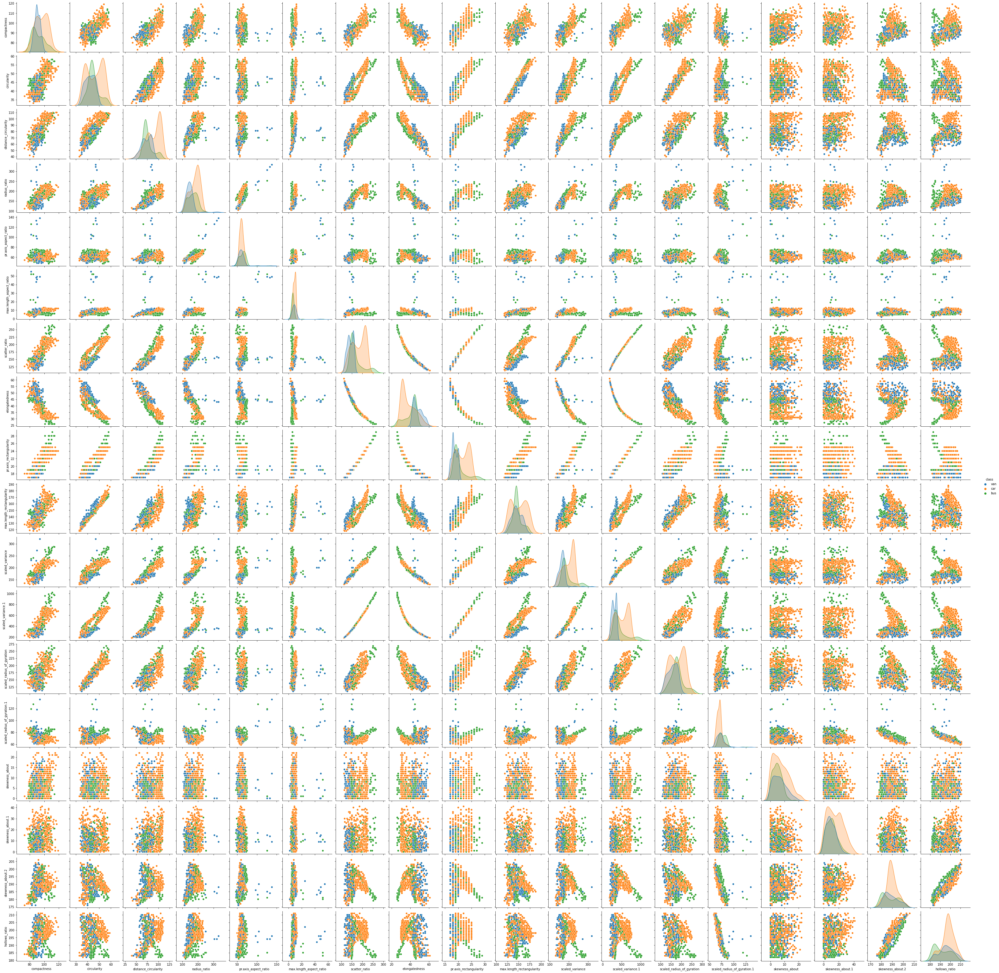

In [53]:
# View the miltivariate pairplot
sns.pairplot(data=df_clean, hue="class")

###### <font color=#B40404>As evidenced from the graph above, few columns are highly correlated with each other and boundaries between different classes are quite overlapped. Let's see if we can create new features with more distinct boundaries.
    
###### <font color=#B40404>Since we do not have much functional knowledge in this area we will use brute force to find new features. Also to simplify our task we will only check whether the means of different target class is significantly different. Although p-stat of means will not generate distinct decision boundaries, it will however be able to check whether majority of the class is significantly on the right side of the decision boundary hyperplane.
    
###### <font color=#B40404>What we will do is that we will find new features by multiplying upto 3 features with each other and dividing upto two features with each other. Then we will perform a welch test on the different classes in this new feature. From the analysis we will create a list of features where all the means of each class is significantly different. Finally we will choose the top 5 most significantly different new features and add it to our main dataset.

In [54]:
# Creating a function which will return required outputs after performing shapiro test
def significance_test(x, y):
    # If Shapiro test clears both groups (Confidence of 95%) then perform welch test else display appropriate message
    if (shapiro(x)[1]<0.05) and (shapiro(y)[1]<0.05):
        # Welch's Test
        t, p = ttest_ind(x, y, equal_var = False)
    else:
        p = np.nan
    return(p)

In [55]:
# Creating analysis dictionary to store results
analysis = {}

# Creating a column of values 1 so that product of 2 and single columns are also considered 
df_clean.insert(df_clean.shape[1]-1, '', 1)

# Performing Welch's t test on normal and abnormal groups for all independent variables
# Running a for loop to extract each attribute name individually
for idx1 in range(len(df_clean.columns[:-2])):
    
    # Assign col1 identity
    col1 = df_clean.columns[idx1]
    for idx2 in range(len(df_clean.columns[:-1])):
        
        # Assign col2 identity
        col2 = df_clean.columns[idx2]
        
        # Avoiding duplicates and cancelling off through if condition
        if not (idx2==df_clean.shape[1]-2 or idx1==idx2):
            # Creating 3 groups based on Dependent variable labels for division
            group1 = df_clean[col1][df_clean["class"]=="car"]/df_clean[col2][df_clean["class"]=="car"]
            group2 = df_clean[col1][df_clean["class"]=="bus"]/df_clean[col2][df_clean["class"]=="bus"]
            group3 = df_clean[col1][df_clean["class"]=="van"]/df_clean[col2][df_clean["class"]=="van"]
            
            # Storing results in analysis dictionary
            analysis[col1+'/'+col2] = []
            analysis[col1+'/'+col2].append(significance_test(group1, group2))
            analysis[col1+'/'+col2].append(significance_test(group3, group2))
            analysis[col1+'/'+col2].append(significance_test(group1, group3))

        for idx3 in range(len(df_clean.columns[:-1])):
            
            # Assign col3 identity
            col3 = df_clean.columns[idx3]
            
            if idx1<=idx2 and idx2<=idx3:
                
                # Creating 3 groups based on Dependent variable labels for product
                group1 = df_clean[col1][df_clean["class"]=="car"]*df_clean[col2][df_clean["class"]=="car"]*df_clean[col3][df_clean["class"]=="car"]
                group2 = df_clean[col1][df_clean["class"]=="bus"]*df_clean[col2][df_clean["class"]=="bus"]*df_clean[col3][df_clean["class"]=="bus"]
                group3 = df_clean[col1][df_clean["class"]=="van"]*df_clean[col2][df_clean["class"]=="van"]*df_clean[col3][df_clean["class"]=="van"]

                # Storing results in analysis dictionary
                analysis[col1+'*'+col2+'*'+col3] = []
                analysis[col1+'*'+col2+'*'+col3].append(significance_test(group1, group2))
                analysis[col1+'*'+col2+'*'+col3].append(significance_test(group3, group2))
                analysis[col1+'*'+col2+'*'+col3].append(significance_test(group1, group3))
                
# Create a dataframe from dictionary for convenience
df_analysis = pd.DataFrame(analysis, index=["CarvsBus", "VanvsBus", "CarvsVan"]).T

# Store the top 5 lowest p value total of three groups in a list
ls_best = df_analysis[(df_analysis<0.05).all(axis=1)].sum(axis=1).sort_values().head().index

# Loop through the best combination names from list to assess which column to operate on
for comb in ls_best:
    
    # Split names into required column names if division
    if '/' in comb:
        tmp = comb.split('/')
        # Create the new feature
        df_clean.insert(0, comb, df_clean[tmp[0]]/df_clean[tmp[1]])
        
    # Split names into required column names if product
    elif '*' in comb:
        tmp = comb.split('*')
        # Create the new feature
        df_clean.insert(0, comb, df_clean[tmp[0]]*df_clean[tmp[1]]*df_clean[tmp[2]])

# Drop the column of 1's as it is no longer required                        
df_clean.drop('', axis=1, inplace=True)

# Display stats of new dataset
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
elongatedness*scaled_radius_of_gyration.1*skewness_about.2,813.0,560184.307503,121441.605617,379890.000000,441210.000000,568832.000000,640250.000000,1091340.0
radius_ratio/max.length_aspect_ratio,813.0,21.546997,6.393115,3.942308,17.909091,20.444444,23.666667,59.5
compactness*elongatedness*scaled_radius_of_gyration.1,813.0,274185.654367,47658.159836,203252.000000,235840.000000,269568.000000,295856.000000,545670.0
distance_circularity*elongatedness*,813.0,3250.584256,278.248811,2440.000000,3060.000000,3240.000000,3430.000000,4095.0
scatter_ratio/max.length_aspect_ratio,813.0,21.610382,6.881016,2.527273,18.363636,20.500000,23.111111,62.5
compactness,813.0,93.656827,8.233751,73.000000,87.000000,93.000000,100.000000,119.0
circularity,813.0,44.803198,6.146659,33.000000,40.000000,44.000000,49.000000,59.0
distance_circularity,813.0,82.043050,15.783070,40.000000,70.000000,79.000000,98.000000,112.0
radius_ratio,813.0,169.098401,33.615402,104.000000,141.000000,167.000000,195.000000,333.0
pr.axis_aspect_ratio,813.0,61.774908,7.973000,47.000000,57.000000,61.000000,65.000000,138.0


###### <font color=#B40404>Now that we have five new features let's confirm that they are useful.

In [56]:
# Performing Tukey's hsd test on different groups, based on Class variable, for all independent variables
# Running a for loop to extract each attribute name individually
for col in df_clean.columns[:-1]:
    # Printing newline for cosmetic purposes
    print("\n", col, "\n")
    # Display Tuhey hsd test results
    print(pairwise_tukeyhsd(df_clean[col], df_clean["class"], alpha=0.05))


 elongatedness*scaled_radius_of_gyration.1*skewness_about.2 

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
   bus    car -74605.3121 0.001  -95404.729 -53805.8953   True
   bus    van  80159.5831 0.001  55807.0223  104512.144   True
   car    van 154764.8953 0.001 133612.0722 175917.7183   True
--------------------------------------------------------------

 radius_ratio/max.length_aspect_ratio 

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper  reject
----------------------------------------------------
   bus    car  -5.4619 0.001   -6.573 -4.3508   True
   bus    van  -9.0068 0.001 -10.3077 -7.7059   True
   car    van  -3.5449 0.001  -4.6749 -2.4149   True
----------------------------------------------------

 compactness*elongatedness*scaled_radius_of_gyration.1 

     Multiple Comparison o

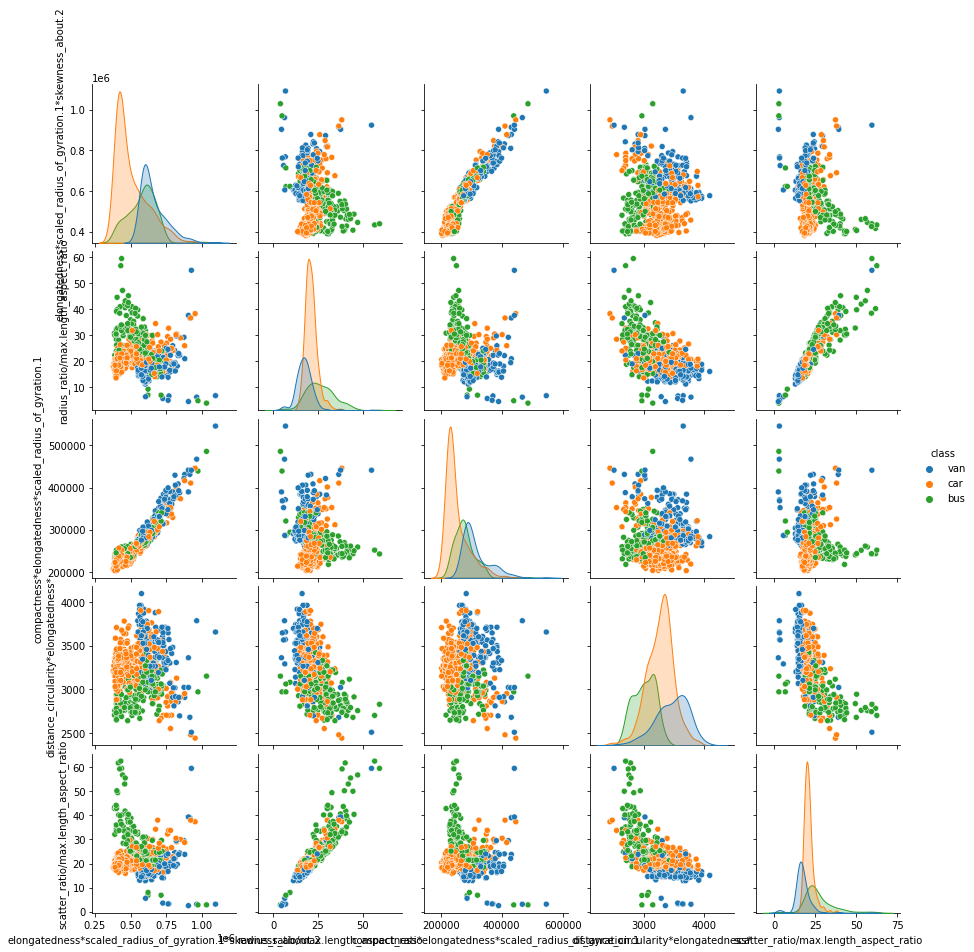

In [57]:
# Visualising through multivariate analysis
sns.pairplot(data=df_clean, vars=df_clean.columns[:5], hue="class")

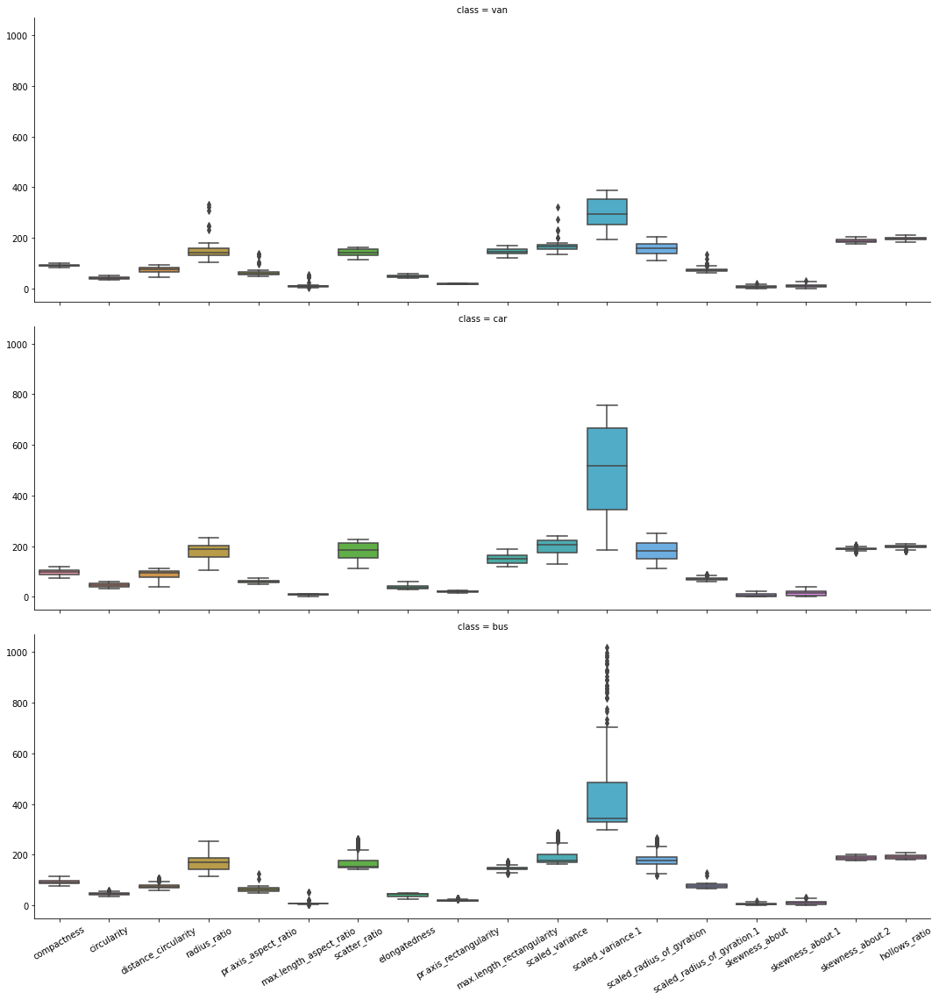

In [58]:
# Visualising through boxplot
g = sns.catplot(data=df_clean.iloc[:, 5:], height=5, aspect=3,
           row="class",
           kind="box")
g.set_xticklabels(rotation=30)

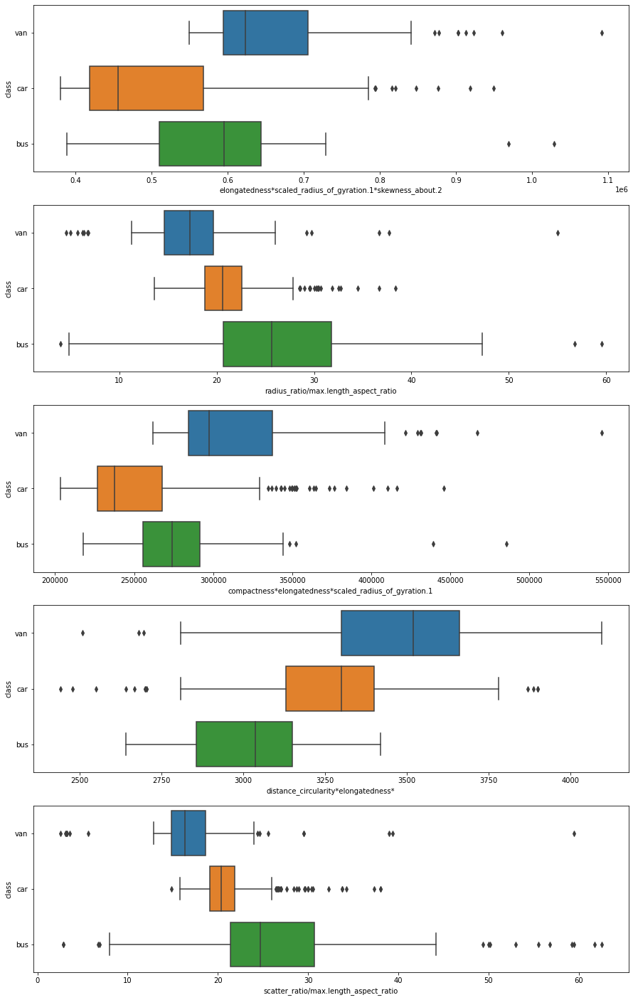

In [59]:
# Visualising through boxplot
fig, axes = plt.subplots(5, 1, figsize=(15, 25))


ax = sns.boxplot(y="class", x=df_clean.columns[0], data=df_clean.drop(df_clean.columns[5:-1], axis=1), ax=axes[0])
ax = sns.boxplot(y="class", x=df_clean.columns[1], data=df_clean.drop(df_clean.columns[5:-1], axis=1), ax=axes[1])
ax = sns.boxplot(y="class", x=df_clean.columns[2], data=df_clean.drop(df_clean.columns[5:-1], axis=1), ax=axes[2])
ax = sns.boxplot(y="class", x=df_clean.columns[3], data=df_clean.drop(df_clean.columns[5:-1], axis=1), ax=axes[3])
ax = sns.boxplot(y="class", x=df_clean.columns[4], data=df_clean.drop(df_clean.columns[5:-1], axis=1), ax=axes[4])
# g = sns.FacetGrid(data=df_clean.drop(df_clean.columns[5:-1], axis=1), height=5, aspect=3,
#                 row="class")
# g.map(sns.boxplot, df_clean.columns[:5])
# g.set_xticklabels(rotation=30)

###### <font color=#B40404>As evidenced from the box plots above, there are a lot of outliers in each class for different features. This suggests that we should be careful while choosing how strictly we want to define our hyperplane and margins.

###### 3. Classifier: Design and train a best fit SVM classier using all the data attributes.

In [60]:
# Seperating Predictor variables, we know the target variable "Class" is the last column
X = df_clean.iloc[:, :-1]

# Seperating Target variables, we know the target variable is called "Class"
y = df_clean["class"]

# Label Encoding target variable
y = y.replace({'car': 0, 'bus': 1, 'van': 2})

# Performing the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Verifying the proportions of y_train and y_test is the same as original dataset
print("y_train proportions")
print(np.unique(y_train, return_counts=True)[1]/len(y_train))

print("y_test proportions")
print(np.unique(y_test, return_counts=True)[1]/len(y_test))

y_train proportions
[0.50769231 0.25230769 0.24      ]
y_test proportions
[0.50920245 0.25153374 0.2392638 ]


In [61]:
# parameter grid
param_grid = {"C": [0.001, 0.01, 0.1, 10, 100],
              'gamma': [0.001, 0.01, 0.1, 10, 100]#,
#               'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
             }

In [62]:
# Creating the SVC model
model = svm.SVC(class_weight="balanced")

In [63]:
# run grid search on 3 folds
folds = 3
grid_search_SVC = GridSearchCV(model, 
                               cv = folds,
                               param_grid=param_grid, 
                               return_train_score=True,                         
                               verbose = 1)

In [64]:
# fit 
grid_search_SVC.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


GridSearchCV(cv=3, estimator=SVC(class_weight='balanced'),
             param_grid={'C': [0.001, 0.01, 0.1, 10, 100],
                         'gamma': [0.001, 0.01, 0.1, 10, 100]},
             return_train_score=True, verbose=1)

In [65]:
# cv results
cv_results = pd.DataFrame(grid_search_SVC.cv_results_)
cv_results.sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
24,0.025942,8.016739e-04,0.015615,4.630551e-04,100,100,"{'C': 100, 'gamma': 100}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
22,0.025587,4.855319e-04,0.015637,4.780470e-04,100,0.1,"{'C': 100, 'gamma': 0.1}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
21,0.027248,4.787153e-04,0.016301,4.620829e-04,100,0.01,"{'C': 100, 'gamma': 0.01}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
20,0.025930,7.018853e-07,0.015625,4.701905e-04,100,0.001,"{'C': 100, 'gamma': 0.001}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
19,0.025599,4.712583e-04,0.015282,4.781003e-04,10,100,"{'C': 10, 'gamma': 100}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
18,0.025276,4.632243e-04,0.015292,4.708647e-04,10,10,"{'C': 10, 'gamma': 10}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
17,0.025601,4.708117e-04,0.015279,4.558096e-04,10,0.1,"{'C': 10, 'gamma': 0.1}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
16,0.026787,2.021402e-04,0.015624,4.698536e-04,10,0.01,"{'C': 10, 'gamma': 0.01}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
15,0.026927,1.410402e-03,0.016290,9.404367e-04,10,0.001,"{'C': 10, 'gamma': 0.001}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000
23,0.024922,1.559087e-05,0.015637,4.774092e-04,100,10,"{'C': 100, 'gamma': 10}",0.506912,0.506912,0.509259,0.507695,0.001106,1,1.000000,1.000000,1.000000,1.000000,0.000000


###### 4. Dimensional reduction: perform dimensional reduction on the data.

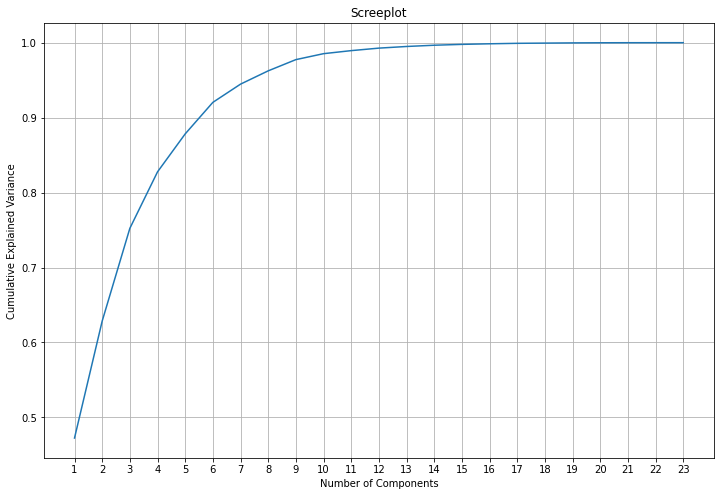

In [66]:
# Initialise PCA
pca = PCA(svd_solver='randomized', random_state=42)

scale = StandardScaler()
# Fit PCA to the required features after scaling
pca.fit(pd.DataFrame(scale.fit_transform(df_clean.iloc[:, :-1])))

# Display the screeplot to determine how many componenets to keep
fig = plt.figure(figsize = (12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.xticks(range(len(pca.explained_variance_ratio_)), range(1, len(pca.explained_variance_ratio_)+1))
plt.ylabel("Cumulative Explained Variance")
plt.title("Screeplot")
plt.grid()
plt.show()

In [67]:
# Display amount of variance explained
print("First 8 components explain %2.5f%% of the variance of the selected features" 
      %(sum(pca.explained_variance_ratio_[:8])*100))

First 8 components explain 96.24240% of the variance of the selected features


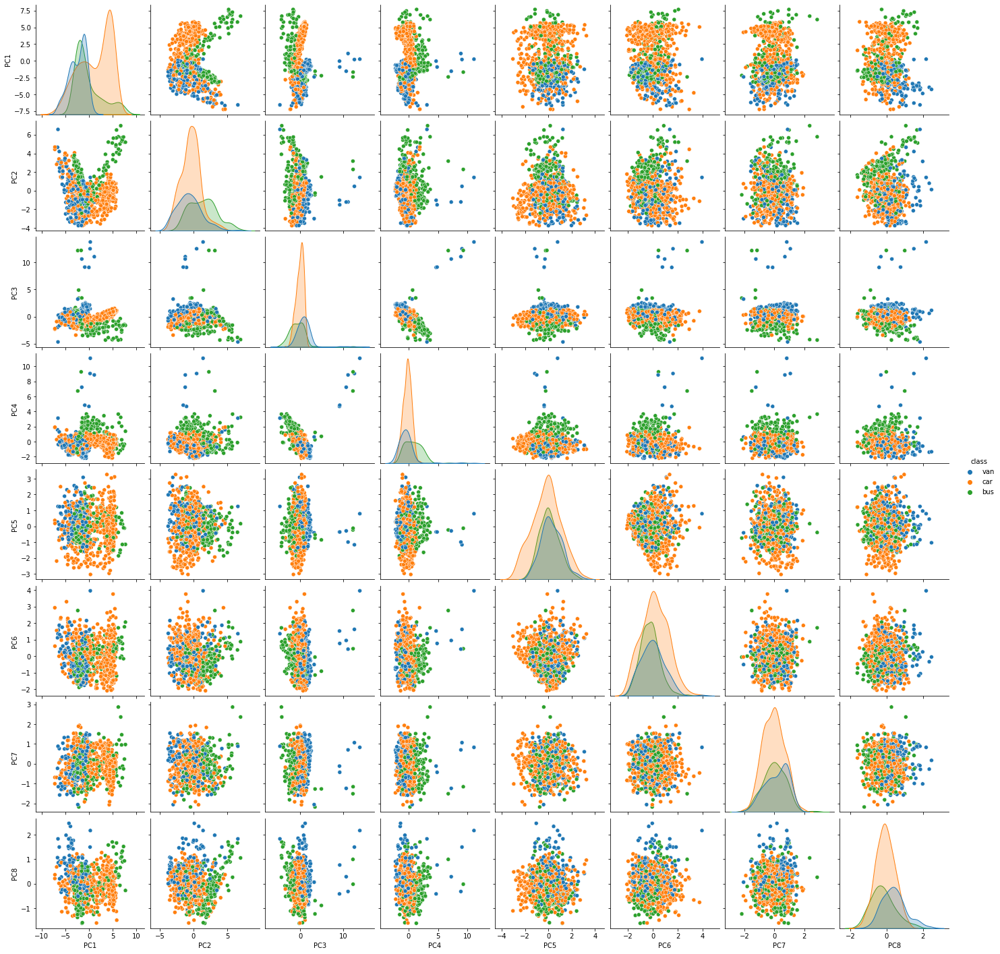

In [68]:
# Reinitialising PCA with the required number of components
pca = PCA(n_components=8, svd_solver='randomized', random_state=42)

# Assigning new features to the auto dataset and dropping compressed features
df_clean.loc[:, ["PC1", "PC2", "PC3", "PC4",
                "PC5", "PC6", "PC7", "PC8"]] = pca.fit_transform(pd.DataFrame(scale.fit_transform(df_clean.iloc[:, :-1])))
df_clean.drop(df_clean.columns[:-9], axis=1, inplace = True)

# Displaying the new pairplot
sns.pairplot(df_clean, hue="class")

###### 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [69]:
# Seperating Target variables, we know the target variable is called "class"
y = df_clean.pop("class")

# Label Encoding target variable
y = y.replace({'car': 0, 'bus': 1, 'van': 2})

# Seperating Predictor variables as X
X = df_clean

# Performing the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Verifying the proportions of y_train and y_test is the same as original dataset
print("y_train proportions")
print(np.unique(y_train, return_counts=True)[1]/len(y_train))

print("y_test proportions")
print(np.unique(y_test, return_counts=True)[1]/len(y_test))

y_train proportions
[0.50769231 0.25230769 0.24      ]
y_test proportions
[0.50920245 0.25153374 0.2392638 ]


In [70]:
# parameter grid
param_grid = {"C": [0.001, 0.01, 0.1, 10, 100],
              'gamma': [0.001, 0.01, 0.1, 10, 100],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
             }

In [71]:
# Creating the SVC model
model = svm.SVC(class_weight="balanced")

In [72]:
# run grid search on 3 folds
folds = 3
grid_search_SVC = GridSearchCV(model, 
                               cv = folds,
                               param_grid=param_grid,
                               return_train_score=True,                         
                               verbose = 1)

In [73]:
# fit 
grid_search_SVC.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


GridSearchCV(cv=3, estimator=SVC(class_weight='balanced'),
             param_grid={'C': [0.001, 0.01, 0.1, 10, 100],
                         'gamma': [0.001, 0.01, 0.1, 10, 100],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             return_train_score=True, verbose=1)

In [74]:
# cv results
cv_results = pd.DataFrame(grid_search_SVC.cv_results_)
cv_results.sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
70,0.006981,1.123916e-07,0.004654,4.704150e-04,10,0.1,rbf,"{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}",0.917051,0.921659,0.925926,0.921545,0.003624,1,0.990762,0.997691,0.993088,0.993847,0.002879
90,0.006659,4.762496e-04,0.004976,1.601846e-05,100,0.1,rbf,"{'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}",0.903226,0.926267,0.930556,0.920016,0.012001,2,1.000000,1.000000,1.000000,1.000000,0.000000
86,0.005984,2.247832e-07,0.003657,4.700217e-04,100,0.01,rbf,"{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}",0.898618,0.926267,0.912037,0.912307,0.011290,3,0.965358,0.960739,0.976959,0.967685,0.006823
66,0.005984,2.973602e-07,0.004322,4.702464e-04,10,0.01,rbf,"{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}",0.894009,0.930876,0.893519,0.906134,0.017496,4,0.933025,0.939954,0.940092,0.937690,0.003299
69,0.017287,3.671663e-03,0.001995,2.973602e-07,10,0.1,poly,"{'C': 10, 'gamma': 0.1, 'kernel': 'poly'}",0.903226,0.884793,0.875000,0.887673,0.011702,5,0.981524,0.993072,0.983871,0.986156,0.004983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23,0.014960,4.495664e-07,0.005984,5.619580e-07,0.01,0.001,sigmoid,"{'C': 0.01, 'gamma': 0.001, 'kernel': 'sigmoid'}",0.253456,0.253456,0.490741,0.332551,0.111857,94,0.251732,0.251732,0.562212,0.355225,0.146362
41,0.011637,4.707009e-04,0.004320,4.715463e-04,0.1,0.001,poly,"{'C': 0.1, 'gamma': 0.001, 'kernel': 'poly'}",0.239631,0.239631,0.513889,0.331051,0.129286,97,0.240185,0.240185,0.509217,0.329862,0.126823
54,0.016301,4.393388e-04,0.011647,4.543431e-04,0.1,10,rbf,"{'C': 0.1, 'gamma': 10, 'kernel': 'rbf'}",0.239631,0.239631,0.509259,0.329507,0.127104,98,0.240185,0.240185,0.760369,0.413579,0.245217
58,0.022273,4.705837e-04,0.014960,8.145881e-04,0.1,100,rbf,"{'C': 0.1, 'gamma': 100, 'kernel': 'rbf'}",0.239631,0.239631,0.509259,0.329507,0.127104,98,0.240185,0.240185,0.760369,0.413579,0.245217


###### 6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

In [75]:
# Creating the SVC model with the best hyper parameters
model = svm.SVC(class_weight="balanced", random_state=42, C=10, gamma=0.1, kernel='rbf')

# Fit the model to the entire train set
model.fit(X_train, y_train)

# Get Predictions
y_pred = model.predict(X_test)

# Create confusion matrix dataframe
df_cm = pd.crosstab(y_test, y_pred)

# Display confusion matrix dataframe
df_cm

col_0,0,1,2
class,,,
0,78,1,4
1,3,38,0
2,2,2,35


In [76]:
# Creating a dictionary with the class information
dict_classes = {0: "car", 1: 'bus', 2: 'van'}

# Displaying the statistics of the classification Report
# Initialising precision and recall variables
prec_avg = 0
rec_avg = 0
for i in range(df_cm.shape[0]):
    # Calculating Precision and Recall
    prec = df_cm.iloc[i, i]/sum(df_cm.iloc[:, i])
    rec = df_cm.iloc[i, i]/sum(df_cm.iloc[i, :])
    
    #Totalling up precision and recall for each label
    prec_avg += prec
    rec_avg += rec
    print(dict_classes[i])
    print("Precision: ", prec)
    print("Recall: ", rec)
    print()
prec_avg = prec_avg/3
rec_avg = rec_avg/3
f1_avg = 2 * (prec_avg * rec_avg)/(prec_avg+rec_avg)
print("F1 Score of the entire model", f1_avg)        

car
Precision:  0.9397590361445783
Recall:  0.9397590361445783

bus
Precision:  0.926829268292683
Recall:  0.926829268292683

van
Precision:  0.8974358974358975
Recall:  0.8974358974358975

F1 Score of the entire model 0.9213414006243862


###### <font color=#B40404>As we can see with dimensionality reduction we achieved much better results and grid search was also faster
    
###### <font color=#B40404>We will have to accept that we could not run the different kernels on all features (Since it was taking too long). However our best estimator on dimensionality reduced dataset chose 'rbf' as the best kernel and in all features 'rbf' was the default kernel. Yet the results were pretty low during grid search, as compared to the results shown by dimensionality reduced dataset on unseen data.

# <center>PART FOUR</center>
# <center>PROJECT BASED</center>
# <center>TOTAL SCORE - 5</center>

• DOMAIN: Sports management

• CONTEXT: Company X is a sports management company for international cricket.

• DATA DESCRIPTION: The data is collected belongs to batsman from IPL series conducted so far. Attribute Information: 
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

• PROJECT OBJECTIVE: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

In [77]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import random

#### Steps and tasks: [ Total Score: 5 points]
###### 1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.

In [78]:
# Load the dataset
df_ipl = pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")

# Display basic information
df_ipl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [79]:
# Removing the blank rows
df_ipl = df_ipl[df_ipl.notnull().any(axis=1)].reset_index(drop=True).copy()

<AxesSubplot:>

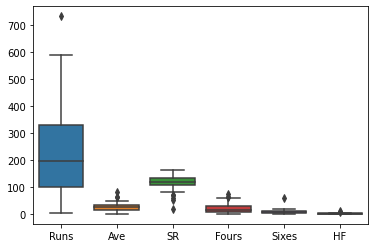

In [80]:
# Displaying boxplot of the dataset
sns.boxplot(data=df_ipl.iloc[:, 1:])

###### <font color=#B40404>At first glance it looks like there are a few outliers. For a task such as this, the outliers are very important as it tells us which players have stood out in some way. Let's go forward and identify these outliers.

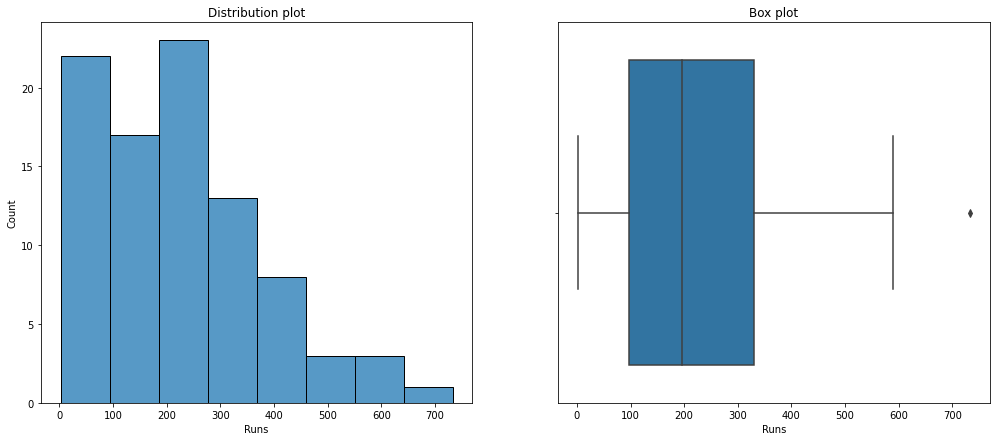

 Total Number of outliers in Runs: 1


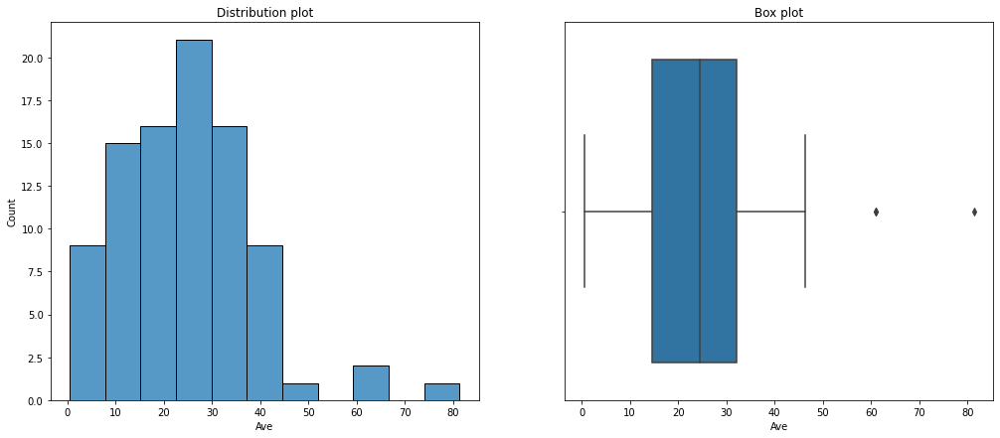

 Total Number of outliers in Ave: 3


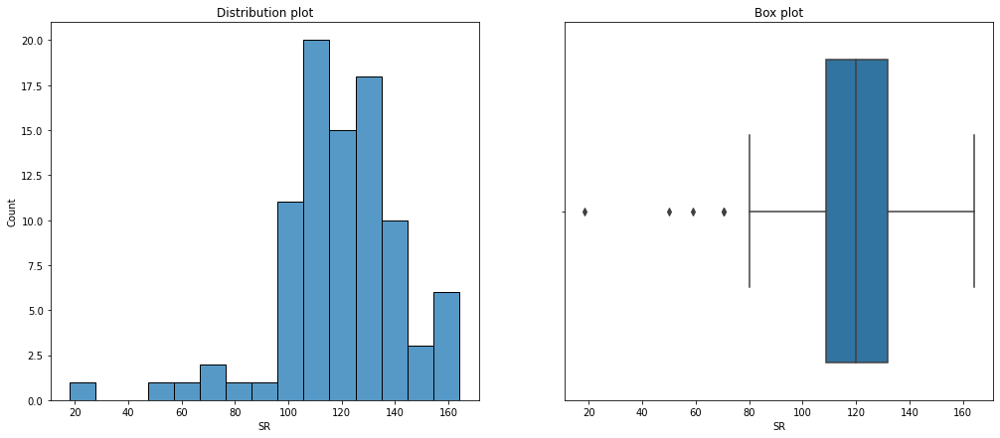

 Total Number of outliers in SR: 5


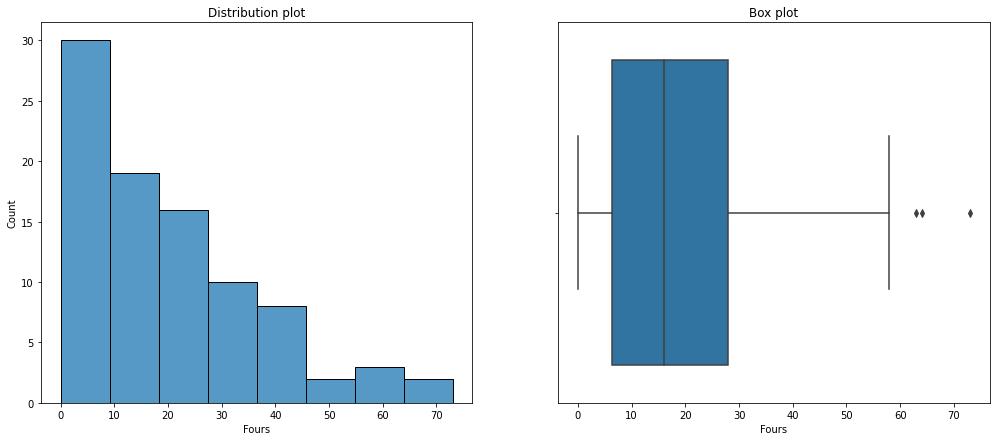

 Total Number of outliers in Fours: 3


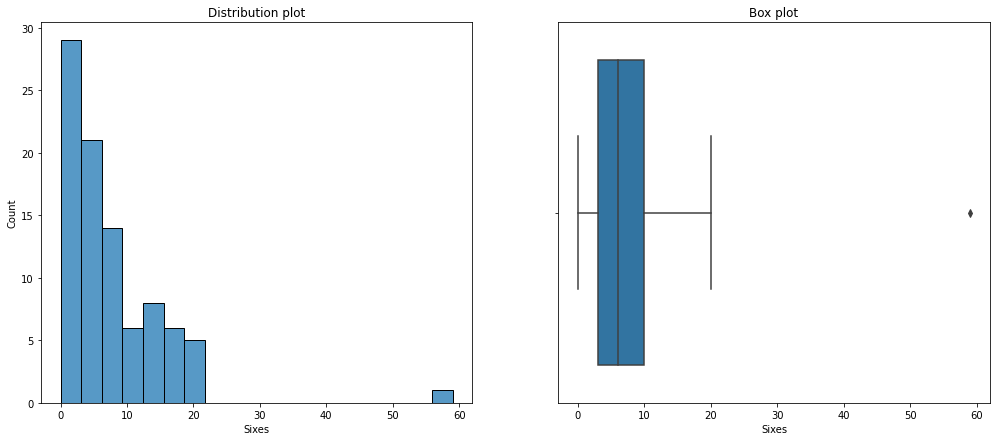

 Total Number of outliers in Sixes: 1


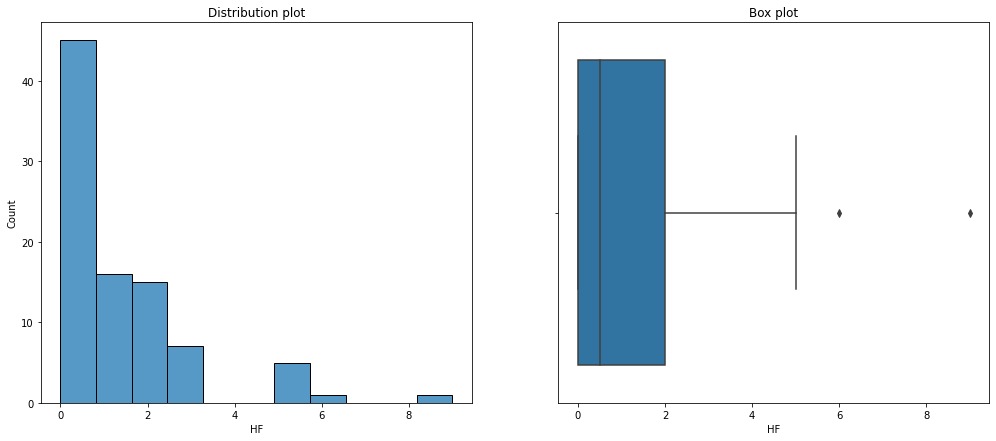

 Total Number of outliers in HF: 2


In [81]:
ls_index = []

# Looping through all continous features
for col in list(df_ipl.columns[1:]):
    # Display Univariate analysis, Histogram and Boxplot
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = col, data=df_ipl,  orient='h' , ax=axes[1])
    sns.histplot(df_ipl[col],  ax=axes[0])
    axes[0].set_title('Distribution plot')
    axes[1].set_title('Box plot')
    plt.show()
    
    # checking count of outliers.
    q25, q75 = np.percentile(df_ipl[col], 25), np.percentile(df_ipl[col], 75)
    IQR = q75-q25
    threshold=IQR*1.5
    lower, upper = q25 - threshold, q75 + threshold
    outliers = [i for i in df_ipl[col] if i < lower or i > upper]
    
    # Store the index of the outlier
    ls_index.extend([i for i in df_ipl[col].index if df_ipl.loc[i, col] > upper])
    print('{} Total Number of outliers in {}: {}'.format('\033[1m', col, len(outliers)))

###### <font color=#B40404>Note that we have stored the index of only the outliers who are above the upper bound since we are looking for the ones who stood out positively instead of negatively. However, the outlier counts above displays the outliers in totality.

In [82]:
# Drop duplicates and display the records of the outliers of each feature
df_ipl.iloc[list(set(ls_index)), :]

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0
6,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0
9,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0
19,R Dravid,462.0,28.87,112.13,63.0,4.0,2.0


###### <font color=#B40404>Outlier search has fetched lot of interesting players. Out of them CH Gayle stands out as outlier in 4 areas, (Runs, Average, Sixes and half centuries). G Gambhir in 2 areas (Fours and half centuries)

###### <font color=#B40404>Finally in the EDA lets look at a scatterplot with most of the features displayed.

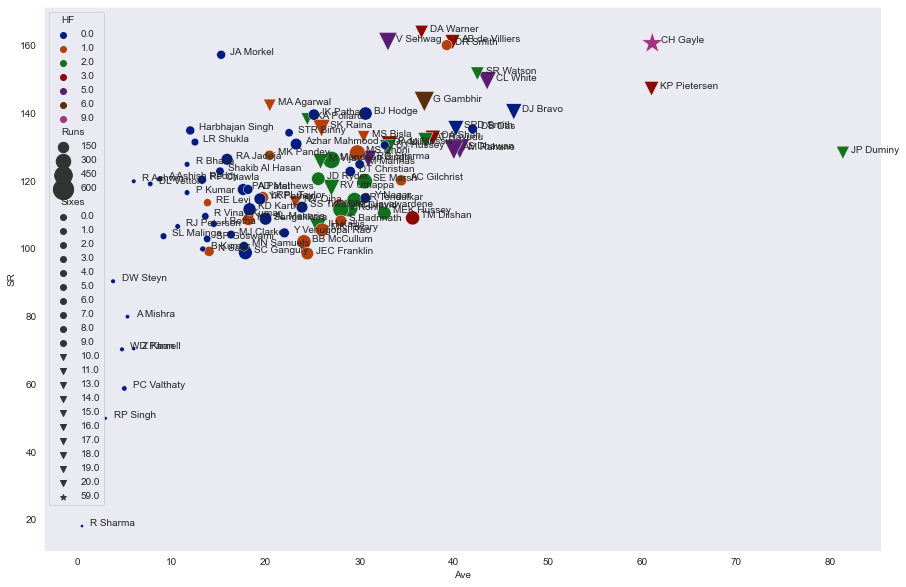

In [83]:
# Create the scatterplot
sns.set_style("dark")
plt.figure(figsize=(15, 10))
ax = sns.scatterplot(data=df_ipl, x="Ave", y="SR", hue="HF", size="Runs", sizes=(10,500), 
                style="Sixes", palette="dark", x_jitter=True, markers = ["o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "v",
                                                                        "v","v","v","v","v","v","v","v","v","*"])

# Mark the coordinates with player names
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.9, point['y'], str(point['val']))

label_point(df_ipl.Ave, df_ipl.SR, df_ipl.Name, plt.gca())  

###### <font color=#B40404>Most player lie in the upper left quadrant. We would expect that some people would also be in the lower right quadrant. Maybe we dont see that because of the nature of the IPL game. There is no value for a slower player with high averages. Hence, the players have adapted to this format. There are a few players in the upper right quadrant, and as batsmen these players stand out. This is because these players not only score a lot of runs but they score them really fast as well.

###### 2. Build a data driven model to rank all the players in the dataset using all or the most important performance features

###### <font color=#B40404>To build the data driven model we will rank the players in 3 categories.

###### <font color=#B40404>Aggressiveness - Strike rates (primary), Sixes (secondary) and Fours (Tertiary)
    
###### <font color=#B40404>Reliability - Averages (primary), runs (secondary)
    
###### <font color=#B40404>Milestones - Half Centuries (primary)
    
###### <font color=#B40404>Aggressivenes will be in the forefront since we would like quick scoring players as the format demands quick runs with not as much concern on losing the wicket. Reliability would come next since good performance regularly is also important. Milestones would be given the next priorty as they are individual achievements. So we will finally get an overall rank using weights (Aggressivenes - 4, Reliability - 3 and Milestones - 1)
    
###### <font color=#B40404>Clients are free to use either the overall rank or any of the individual components of the overall rank to search its best players.

In [84]:
# Create the Aggressiveness ranks
df_ipl.sort_values(["SR", "Sixes", "Fours"], ascending=False, inplace=True)
df_ipl["Aggressiveness"] = np.arange(1, len(df_ipl)+1)

# Create the Reliability ranks
df_ipl.sort_values(["Ave", "Runs", "Fours"], ascending=False, inplace=True)
df_ipl["Reliability"] = np.arange(1, len(df_ipl)+1)

# Create the Milestones ranks
df_ipl.sort_values(["HF"], ascending=False, inplace=True)
df_ipl["Milestones"] = np.arange(1, len(df_ipl)+1)

# Create the Overall ranks
df_ipl["Overall"] = (df_ipl["Aggressiveness"] * 4) + (df_ipl["Reliability"] * 3) + (df_ipl["Milestones"])
df_ipl.sort_values(["Overall"], ascending=True, inplace=True)
df_ipl["Overall"] = np.arange(1, len(df_ipl)+1)

# Reset dataframe by index
df_ipl.sort_index(inplace=True)

In [85]:
# Display the complete dataset
df_ipl

,Name,Runs,Ave,SR,Fours,Sixes,HF,Aggressiveness,Reliability,Milestones,Overall
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,4,2,1,1
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,10,15,2,8
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,2,20,3,6
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,8,5,5,2
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,29,8,6,12
...,...,...,...,...,...,...,...,...,...,...,...
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,86,84,64,86
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,87,87,56,87
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,88,86,66,89
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,89,89,48,88


In [86]:
# Create an error list
ls_fdbk = ["Please follow the rules of the game", "You are failing under pressure try again",
           "Howzzat something you do not get?", "This will get boring if you do not follow the rules of the pitch",
           "Please deliver something I can process", "This game was not made for you"]

# Cosmetics for user input
print("Select one of the following ranking system :-")
print("\n(A) Aggressiveness\n(R) Reliability\n(M) Milestones\n(O) Overall")

# Validation of inputs
while True:
    r = str.lower(input("Select the ranking system chosen based on above: ")[0])
    if r in ["a", "r", "m", "o"]:
        break
    else:
        print(ls_fdbk[int(np.round(random.random()*5))])
while True:
    try:
        n = int(input("\nNow please select the number of top players you need "))
        if n>0 and n<=90:
            break
        elif n==0:
            print("If you were gonna choose 0 then why waste my time :-(")
            break
    except:
        print("Just a number between 1 and 90 please :-)")

# Displaying User defined results
print("\nNames in order from rank 1 going down\n")
if r == "a":
    print(list(df_ipl.sort_values("Aggressiveness")["Name"].head(n)))
if r == "r":
    print(list(df_ipl.sort_values("Reliability")["Name"].head(n)))
if r == "m":
    print(list(df_ipl.sort_values("Milestones")["Name"].head(n)))
if r == "o":
    print(list(df_ipl.sort_values("Overall")["Name"].head(n)))

Select one of the following ranking system :-

(A) Aggressiveness
(R) Reliability
(M) Milestones
(O) Overall
Select the ranking system chosen based on above: O

Now please select the number of top players you need 5

Names in order from rank 1 going down

['CH Gayle', 'CL White', 'AB de Villiers', 'KP Pietersen', 'DA Warner']


# <center>PART FIVE</center>
# <center>QUESTION BASED</center>
# <center>TOTAL SCORE - 5</center>

#### • Questions: [ Total Score: 5 points]
###### 1. List down all possible dimensionality reduction techniques that can be implemented using python.

###### <font color=#B40404>1. Feature Selection - Forward Consttruction Method, Backward Elimination Method, Variance Inflation Factor etc.
###### <font color=#B40404>2. Singular Value Decomposition
###### <font color=#B40404>3. Linear Discriminant Analysis
###### <font color=#B40404>4. Principal Component Analysis
###### <font color=#B40404>5. Dropping duplicate records
###### <font color=#B40404>6. Dropping records with Null values
###### <font color=#B40404>7. Combining Features and dropping original ones
    
###### <font color=#B40404>There are still other methods of Dimensionality Reduction through CLustering, ISOMAP, Manifold Learning, Stochastic Neighbor Embedding etc. which I have not explored too much yet. 

###### 2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

(266, 474, 3)


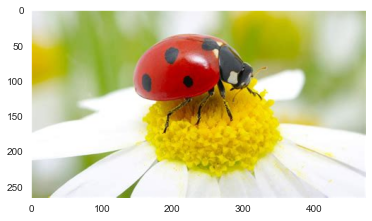

In [87]:
# importing required Libraries
import matplotlib.image as mplib 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Reading an image and printing the shape of the image. 
img = mplib.imread('pic.jfif')
print(img.shape)
plt.imshow(img)

In [88]:
# Reshape the image into 2D form
img_r = np.reshape(img, (266, 1422)) 
print(img_r.shape)

(266, 1422)


In [89]:
# Reducing Dimensions
pca = PCA(n_components=32)
img_r = pca.fit_transform(img_r)
print(img_r.shape)
print(np.sum(pca.explained_variance_ratio_))

(266, 32)
0.9882504934529224


(266, 1422)


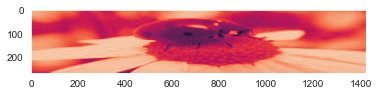

In [90]:
###### Reversing the dimensionality reduction however, some portion of the information has been lost
image = pca.inverse_transform(img_r)
print(image.shape)
plt.imshow(image)

###### <font color=#B40404>Some portion of the information has been lost but the essence of the picture has been maintained even after PCA was applied.
    
###### <font color=#B40404>In conclusion, yes, Dimensionality reduction can be applied to pictures (as evidenced above) and similarly to videos and audios. It can be applied to text as well when we consider that a meaningful sentence can be formed without all the words. Funnily enough we can see this in real world as well when we consider that our online text messages are mainly shortened sentences with only the essential words being entered. This model can be applied to text as well for dimensionality reduction. There is a special bag of words called stopwords which achieves this desired result.